In [160]:
import os
import math
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

warnings.filterwarnings("ignore")
print(f"PyTorch {torch.__version__} | CUDA: {torch.cuda.is_available()} | MPS: {torch.backends.mps.is_available()}")

PyTorch 2.11.0 | CUDA: False | MPS: True


In [161]:
DATA_ROOT      = Path("./Data/training")
IMAGES_DIR     = DATA_ROOT / "Clean_Images"
TIMESERIES_DIR = DATA_ROOT / "Timeseries"
STRIPS_DIR     = DATA_ROOT / "Strips"
MASKS_DIR      = DATA_ROOT / "Masks"
CHUNKS_DIR     = DATA_ROOT / "Chunks"
CHECKPOINT_DIR = Path("./checkpoints")

BLACK_THRESHOLD     = 80
CAL_SPIKE_THRESHOLD = 25
LEFT_PCT            = 0.10
MIN_INTER_STRIP_GAP = 150
HEADER_GAP_RATIO    = 3.0
PADDING             = 20
COL_SPIKE_THRESHOLD = 50
MIN_CONSECUTIVE     = 5

if torch.cuda.is_available():
    DEVICE = "cuda"
elif torch.backends.mps.is_available():
    DEVICE = "mps"
else:
    DEVICE = "cpu"
print(f"Using device: {DEVICE}")


Using device: mps


In [162]:
def detect_signal_bands(img, target_bands=4):
    h, w = img.shape[:2]

    # Isolate left region where calibration pulse lives
    left = img[:, :int(w * LEFT_PCT)]
    b, g, r = cv2.split(left)
    black_mask = (r < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (b < BLACK_THRESHOLD)
    row_sums = black_mask.sum(axis=1).astype(float)

    # Subtract 1 to ignore the left border line
    row_sums = np.maximum(row_sums - 1, 0)
    spike_rows = np.where(row_sums > CAL_SPIKE_THRESHOLD)[0]

    # Group consecutive spike rows; take midpoint of each group as an anchor
    anchors = []
    if len(spike_rows) > 0:
        group_start = spike_rows[0]
        prev = spike_rows[0]
        for r_idx in spike_rows[1:]:
            if r_idx - prev > 5:
                anchors.append(int((group_start + prev) // 2))
                group_start = r_idx
            prev = r_idx
        anchors.append(int((group_start + prev) // 2))

    if len(anchors) < 2:
        return [(0, h)], anchors

    # Separate header anchors from signal anchors using gap ratio
    diffs = [anchors[i+1] - anchors[i] for i in range(len(anchors) - 1)]
    median_diff = np.median(diffs)
    header_cut = 0
    for i, d in enumerate(diffs):
        if d > median_diff * HEADER_GAP_RATIO:
            header_cut = i + 1
            break
    signal_anchors = anchors[header_cut:]

    # Merge anchors that are too close together
    strip_anchors = []
    prev = -MIN_INTER_STRIP_GAP
    for anchor in signal_anchors:
        if anchor - prev >= MIN_INTER_STRIP_GAP:
            strip_anchors.append(anchor)
            prev = anchor

    # Build band boundaries
    signal_bands = []
    for i, anchor in enumerate(strip_anchors):
        top = max(0, anchor - PADDING)
        bot = min(h, strip_anchors[i+1] - PADDING) if i+1 < len(strip_anchors) else h
        signal_bands.append((top, bot))

    # If too many bands, drop the shortest
    if len(signal_bands) > target_bands:
        ranked = sorted(signal_bands, key=lambda b: b[1] - b[0], reverse=True)
        kept = set(map(tuple, ranked[:target_bands]))
        signal_bands = [b for b in signal_bands if tuple(b) in kept]

    return signal_bands, strip_anchors


def split_ecg_strips(image_path, output_dir, target_bands=4):
    img = cv2.imread(str(image_path))
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")
    signal_bands, _ = detect_signal_bands(img, target_bands=target_bands)
    os.makedirs(output_dir, exist_ok=True)
    stem = Path(image_path).stem
    saved = []
    for i, (y1, y2) in enumerate(signal_bands):
        out_path = os.path.join(output_dir, f"{stem}_strip_{i+1}.png")
        cv2.imwrite(out_path, img[y1:y2, :])
        saved.append(out_path)
    return saved


Found 600 images


Splitting strips:   0%|          | 0/600 [00:00<?, ?it/s]


Strip count distribution: {4: 600}
Errors: 0


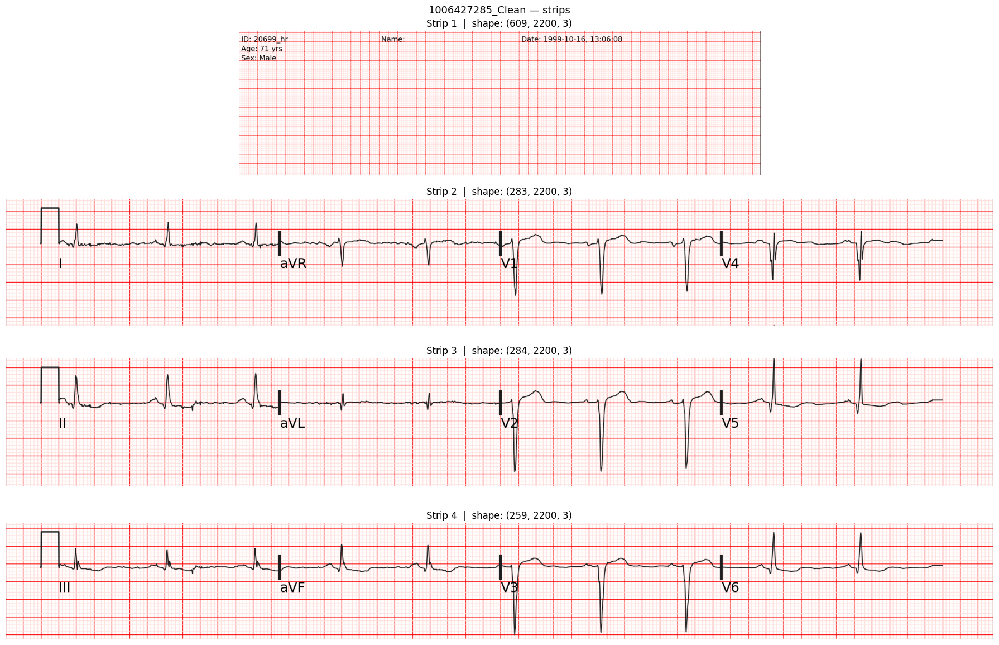

In [163]:
image_paths = sorted(list(IMAGES_DIR.glob("*.png")) + list(IMAGES_DIR.glob("*.jpg")))
print(f"Found {len(image_paths)} images")

errors = []
strip_counts = []
for img_path in tqdm(image_paths, desc="Splitting strips"):
    try:
        saved = split_ecg_strips(img_path, STRIPS_DIR)
        strip_counts.append(len(saved))
    except Exception as e:
        errors.append((img_path.name, str(e)))

print(f"\nStrip count distribution: {pd.Series(strip_counts).value_counts().to_dict()}")
print(f"Errors: {len(errors)}")
if errors:
    for name, err in errors[:5]:
        print(f"  {name}: {err}")

# Visual check
sample_path = image_paths[0]
strip_paths = sorted(STRIPS_DIR.glob(f"{sample_path.stem}_strip_*.png"))

fig, axes = plt.subplots(len(strip_paths), 1, figsize=(18, 3 * len(strip_paths)))
if len(strip_paths) == 1:
    axes = [axes]
fig.suptitle(f"{sample_path.stem} — strips", fontsize=13)
for i, sp in enumerate(strip_paths):
    strip_img = cv2.cvtColor(cv2.imread(str(sp)), cv2.COLOR_BGR2RGB)
    axes[i].imshow(strip_img)
    axes[i].set_title(f"Strip {i+1}  |  shape: {strip_img.shape}")
    axes[i].axis("off")
plt.tight_layout()
plt.show()

Image: 3647678944_Clean  |  Strips found: 4


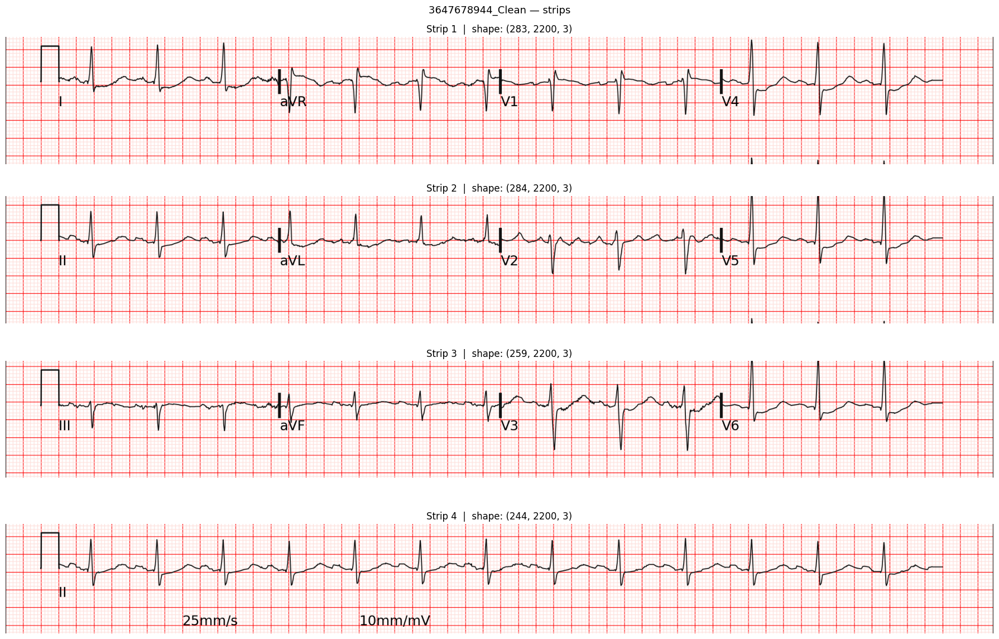

In [164]:
import random

sample_path = random.choice(image_paths)
strip_paths = sorted(STRIPS_DIR.glob(f"{sample_path.stem}_strip_*.png"))

print(f"Image: {sample_path.stem}  |  Strips found: {len(strip_paths)}")

fig, axes = plt.subplots(len(strip_paths), 1, figsize=(18, 3 * len(strip_paths)))
if len(strip_paths) == 1:
    axes = [axes]
fig.suptitle(f"{sample_path.stem} — strips", fontsize=13)
for i, sp in enumerate(strip_paths):
    strip_img = cv2.cvtColor(cv2.imread(str(sp)), cv2.COLOR_BGR2RGB)
    axes[i].imshow(strip_img)
    axes[i].set_title(f"Strip {i+1}  |  shape: {strip_img.shape}")
    axes[i].axis("off")
plt.tight_layout()
plt.show()

In [165]:
def generate_mask(img_bgr: np.ndarray) -> np.ndarray:
    """Near-black ECG signal pixels 255, background 0"""
    b, g, r = cv2.split(img_bgr)
    black_mask = ((b < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (r < BLACK_THRESHOLD)).astype(np.uint8) * 255
    kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    kernel_open  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
    mask = cv2.morphologyEx(black_mask, cv2.MORPH_CLOSE, kernel_close, iterations=2)
    mask = cv2.morphologyEx(mask,       cv2.MORPH_OPEN,  kernel_open,  iterations=1)
    return mask

In [166]:
MASKS_DIR.mkdir(parents=True, exist_ok=True)
strip_paths = sorted(STRIPS_DIR.glob("*.png"))
print(f"Found {len(strip_paths)} strips")

for strip_path in tqdm(strip_paths, desc="Generating masks"):
    img  = cv2.imread(str(strip_path))
    mask = generate_mask(img)
    out_path = MASKS_DIR / (strip_path.stem + "_mask.png")
    cv2.imwrite(str(out_path), mask)

print(f"Done {len(list(MASKS_DIR.glob('*.png')))} masks saved to {MASKS_DIR}")

Found 2400 strips


Generating masks:   0%|          | 0/2400 [00:00<?, ?it/s]

Done 2400 masks saved to Data/training/Masks


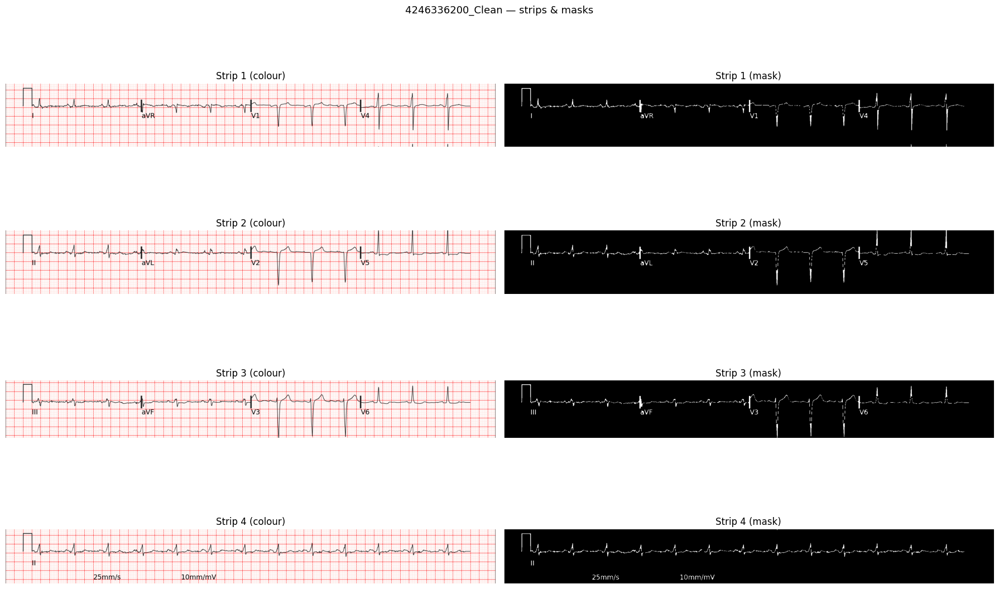

In [167]:
sample_path = random.choice(image_paths)
strip_paths_sample = sorted(STRIPS_DIR.glob(f"{sample_path.stem}_strip_*.png"))

fig, axes = plt.subplots(len(strip_paths_sample), 2, figsize=(18, 3 * len(strip_paths_sample)))
fig.suptitle(f"{sample_path.stem} — strips & masks", fontsize=13)
for i, sp in enumerate(strip_paths_sample):
    strip_img = cv2.cvtColor(cv2.imread(str(sp)), cv2.COLOR_BGR2RGB)
    mask_path = MASKS_DIR / (sp.stem + "_mask.png")
    mask      = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    axes[i, 0].imshow(strip_img)
    axes[i, 0].set_title(f"Strip {i+1} (colour)")
    axes[i, 0].axis("off")
    axes[i, 1].imshow(mask, cmap="gray")
    axes[i, 1].set_title(f"Strip {i+1} (mask)")
    axes[i, 1].axis("off")
plt.tight_layout()
plt.show()

In [168]:
import easyocr

reader = easyocr.Reader(['en'], gpu=(DEVICE != 'cpu'))

In [169]:
def remove_text_from_mask(mask, orig_strip):
    """Use EasyOCR to find text bounding boxes then zero them out in the mask."""
    results = reader.readtext(orig_strip)
    
    clean_mask = mask.copy()
    for (bbox, text, conf) in results:
        if conf < 0.001:  # ignore very low confidence detections
            continue
        # bbox is [[x1,y1],[x2,y1],[x2,y2],[x1,y2]]
        xs = [int(p[0]) for p in bbox]
        ys = [int(p[1]) for p in bbox]
        x1, x2 = max(0, min(xs)), min(mask.shape[1], max(xs))
        y1, y2 = max(0, min(ys)), min(mask.shape[0], max(ys))
        clean_mask[y1:y2, x1:x2] = 0
    
    return clean_mask

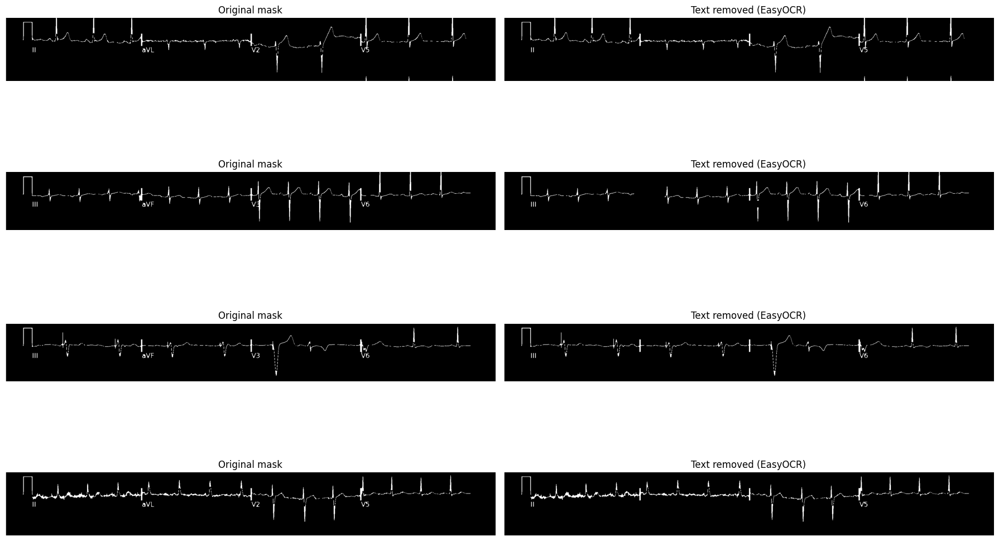

In [170]:
# Visual check on 4 random strips
fig, axes = plt.subplots(4, 2, figsize=(18, 12))
for row in range(4):
    strip_path = random.choice(sorted(STRIPS_DIR.glob("*.png")))
    strip      = cv2.imread(str(strip_path))
    mask       = generate_mask(strip)
    mask_clean = remove_text_from_mask(mask, strip)
    axes[row, 0].imshow(mask,       cmap="gray")
    axes[row, 0].set_title("Original mask")
    axes[row, 0].axis("off")
    axes[row, 1].imshow(mask_clean, cmap="gray")
    axes[row, 1].set_title("Text removed (EasyOCR)")
    axes[row, 1].axis("off")
plt.tight_layout()
plt.show()

As one can see text removal isn't going very well. Maybe we skip this for now

Now we want to learn how to isolate one of the blocks so we can partition the strips

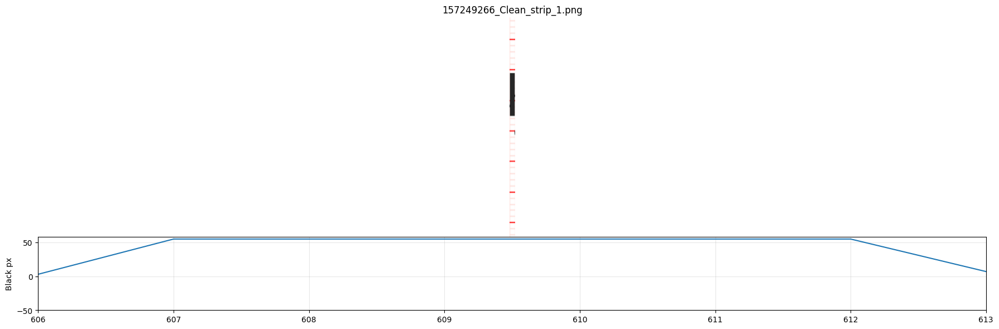

In [171]:
sample_strip_path = random.choice(sorted(STRIPS_DIR.glob("*_strip_1.png")))
sample_strip      = cv2.imread(str(sample_strip_path))

b, g, r = cv2.split(sample_strip)
is_black = (r < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (b < BLACK_THRESHOLD)
col_sums = is_black.sum(axis=0).astype(float)

h, w = sample_strip.shape[:2]

fig, axes = plt.subplots(2, 1, figsize=(18, 6), gridspec_kw={"height_ratios": [3, 1]})

xmin = 606
xmax = 613
ymin = -50
ymax = 58

axes[0].imshow(cv2.cvtColor(sample_strip, cv2.COLOR_BGR2RGB))
axes[0].set_xlim(xmin, xmax)
axes[0].set_title(sample_strip_path.name)
axes[0].axis("off")

axes[1].plot(col_sums)
axes[1].set_xlim(xmin, xmax)   # align x axis exactly with image above
axes[1].set_ylim(ymin, ymax) 
axes[1].set_ylabel("Black px")
axes[1].grid(True, alpha=0.3)

plt.tight_layout(h_pad=0)
plt.show()

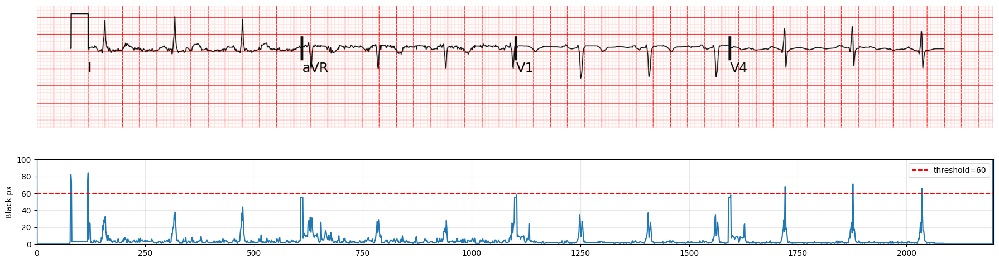

Cols above 60: [   0   78   79   80  117  118  119 1721 1877 2036 2199]


In [172]:
sample_strip_path = random.choice(sorted(STRIPS_DIR.glob("*_strip_1.png")))
sample_strip      = cv2.imread(str(sample_strip_path))

b, g, r = cv2.split(sample_strip)
is_black = (r < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (b < BLACK_THRESHOLD)
col_sums = is_black.sum(axis=0).astype(float)

h, w = sample_strip.shape[:2]

fig, axes = plt.subplots(2, 1, figsize=(18, 6), gridspec_kw={"height_ratios": [3, 1]})
axes[0].imshow(cv2.cvtColor(sample_strip, cv2.COLOR_BGR2RGB))
axes[0].set_xlim(0, w)
axes[0].axis("off")

axes[1].plot(col_sums)
axes[1].axhline(y=60, color='r', linestyle='--', label='threshold=60')
axes[1].set_xlim(0, w)
axes[1].set_ylim(0, 100)   # zoom in to see the separator spikes clearly
axes[1].set_ylabel("Black px")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout(h_pad=0)
plt.show()

print("Cols above 60:", np.where(col_sums > 60)[0])

In [173]:
sample_strip_path = random.choice(sorted(STRIPS_DIR.glob("*_strip_1.png")))
sample_strip      = cv2.imread(str(sample_strip_path))

b, g, r = cv2.split(sample_strip)
is_black = (r < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (b < BLACK_THRESHOLD)
col_sums = is_black.sum(axis=0).astype(float)

# Print all columns above 40 with their indices
above = np.where(col_sums > 40)[0]
print("Columns above 40:")
print(list(zip(above, col_sums[above].astype(int))))

Columns above 40:
[(np.int64(0), np.int64(283)), (np.int64(78), np.int64(81)), (np.int64(79), np.int64(82)), (np.int64(80), np.int64(78)), (np.int64(117), np.int64(76)), (np.int64(118), np.int64(82)), (np.int64(119), np.int64(81)), (np.int64(164), np.int64(49)), (np.int64(398), np.int64(45)), (np.int64(607), np.int64(55)), (np.int64(608), np.int64(55)), (np.int64(609), np.int64(55)), (np.int64(610), np.int64(55)), (np.int64(611), np.int64(55)), (np.int64(612), np.int64(55)), (np.int64(1099), np.int64(55)), (np.int64(1100), np.int64(55)), (np.int64(1101), np.int64(55)), (np.int64(1102), np.int64(55)), (np.int64(1103), np.int64(55)), (np.int64(1104), np.int64(58)), (np.int64(1591), np.int64(55)), (np.int64(1592), np.int64(55)), (np.int64(1593), np.int64(55)), (np.int64(1594), np.int64(55)), (np.int64(1595), np.int64(55)), (np.int64(1596), np.int64(58)), (np.int64(1798), np.int64(41)), (np.int64(1799), np.int64(63)), (np.int64(1800), np.int64(47)), (np.int64(1803), np.int64(55)), (np.int6

Split points: [609, 1101, 1593]  (expected 3)


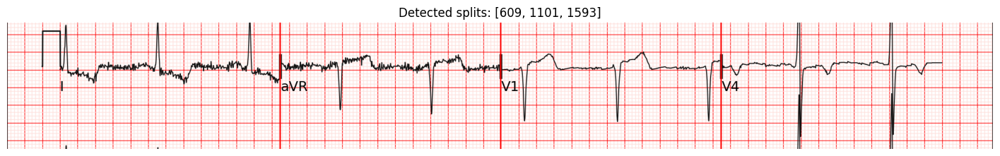

In [174]:
def find_split_points(strip):
    h, w = strip.shape[:2]
    b, g, r = cv2.split(strip)
    is_black = (r < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (b < BLACK_THRESHOLD)
    col_sums = is_black.sum(axis=0).astype(float)

    spike_cols = np.where(col_sums > 50)[0]

    # Group consecutive columns
    groups = []
    if len(spike_cols) > 0:
        group = [spike_cols[0]]
        for col in spike_cols[1:]:
            if col == group[-1] + 1:
                group.append(col)
            else:
                groups.append(group)
                group = [col]
        groups.append(group)

    # Filter obvious non-separators: borders, too narrow, too tall
    candidates = []
    for group in groups:
        width   = len(group)
        center  = int(np.mean(group))
        max_sum = col_sums[group].max()
        if width >= 4 and center > 10 and center < w - 10 and max_sum < 200:
            candidates.append((center, max_sum, width))

    if len(candidates) == 0:
        return []

    # We always expect 3 separators roughly evenly spaced at w/4, w/2, 3w/4
    # Score each candidate by how close it is to the expected positions
    expected = [w * 0.25, w * 0.50, w * 0.75]

    if len(candidates) >= 3:
        # Pick the best candidate for each expected position
        split_points = []
        used = set()
        for exp_x in expected:
            best = min(
                [c for i, c in enumerate(candidates) if i not in used],
                key=lambda c: abs(c[0] - exp_x)
            )
            idx = candidates.index(best)
            used.add(idx)
            split_points.append(best[0])
        return sorted(split_points)

    # Too few candidates — fall back to returning what we have
    return sorted([c[0] for c in candidates])

# Visual check
sample_strip_path = STRIPS_DIR / "3780045249_Clean_strip_1.png" #random.choice(sorted(STRIPS_DIR.glob("*_strip_1.png"))) this is an example of it not working
sample_strip      = cv2.imread(str(sample_strip_path))
split_points      = find_split_points(sample_strip)
print(f"Split points: {split_points}  (expected 3)")

vis = cv2.cvtColor(sample_strip, cv2.COLOR_BGR2RGB).copy()
for x in split_points:
    vis[:, max(0,x-1):x+2] = [255, 0, 0]

plt.figure(figsize=(18, 4))
plt.imshow(vis)
plt.title(f"Detected splits: {split_points}")
plt.axis("off")
plt.show()

In [175]:
def split_strip_into_chunks(strip_path, mask_path, output_dir):
    strip_idx = int(strip_path.stem.split("_strip_")[1])
    if strip_idx == 4:
        return [], None  #strip 4 doesn't have the different chunks

    strip = cv2.imread(str(strip_path))
    mask  = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)

    split_points = find_split_points(strip)

    if len(split_points) != 3:
        return None, f"Expected 3 split points, got {len(split_points)}"

    os.makedirs(output_dir, exist_ok=True)
    stem   = Path(strip_path).stem
    bounds = [0] + split_points + [strip.shape[1]]
    saved  = []
    for i in range(len(bounds) - 1):
        x1, x2   = bounds[i], bounds[i+1]
        chunk    = mask[:, x1:x2]
        out_path = Path(output_dir) / f"{stem}_chunk_{i+1}.png"
        cv2.imwrite(str(out_path), chunk)
        saved.append(str(out_path))

    return saved, None

# Run on all strips
CHUNKS_DIR.mkdir(parents=True, exist_ok=True)
strip_paths = sorted(STRIPS_DIR.glob("*.png"))
print(f"Found {len(strip_paths)} strips")

errors = []
total  = 0
for strip_path in tqdm(strip_paths, desc="Splitting chunks"):
    mask_path = MASKS_DIR / (strip_path.stem + "_mask.png")
    if not mask_path.exists():
        errors.append((strip_path.name, "mask not found"))
        continue
    saved, err = split_strip_into_chunks(strip_path, mask_path, CHUNKS_DIR)
    if err:
        errors.append((strip_path.name, err))
    else:
        total += len(saved)

print(f"\nSaved {total} chunks to {CHUNKS_DIR}")
print(f"Errors: {len(errors)}")
if errors:
    for name, err in errors[:10]:
        print(f"  {name}: {err}")

Found 2400 strips


Splitting chunks:   0%|          | 0/2400 [00:00<?, ?it/s]


Saved 7056 chunks to Data/training/Chunks
Errors: 36
  1006427285_Clean_strip_1.png: Expected 3 split points, got 0
  1436234058_Clean_strip_1.png: Expected 3 split points, got 0
  1492606769_Clean_strip_2.png: Expected 3 split points, got 2
  1512936796_Clean_strip_1.png: Expected 3 split points, got 0
  157249266_Clean_strip_2.png: Expected 3 split points, got 2
  1589810571_Clean_strip_1.png: Expected 3 split points, got 0
  1771293531_Clean_strip_1.png: Expected 3 split points, got 0
  1883137811_Clean_strip_1.png: Expected 3 split points, got 0
  2042532735_Clean_strip_1.png: Expected 3 split points, got 0
  2080106037_Clean_strip_1.png: Expected 3 split points, got 0


1445349505_Clean_strip_1  —  4 chunks


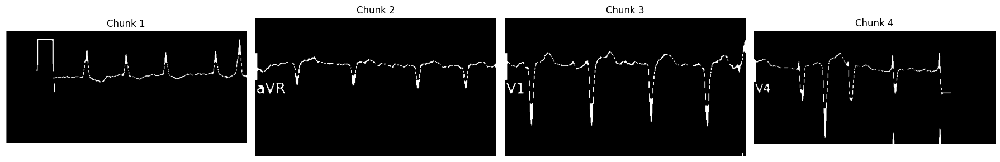

In [176]:
sample_strip_path = random.choice(sorted(STRIPS_DIR.glob("*_strip_1.png")))
stem         = sample_strip_path.stem
chunk_paths  = sorted(CHUNKS_DIR.glob(f"{stem}_chunk_*.png"))
print(f"{stem}  —  {len(chunk_paths)} chunks")

fig, axes = plt.subplots(1, len(chunk_paths), figsize=(18, 4))
for i, cp in enumerate(chunk_paths):
    chunk = cv2.imread(str(cp), cv2.IMREAD_GRAYSCALE)
    axes[i].imshow(chunk, cmap="gray")
    axes[i].set_title(f"Chunk {i+1}")
    axes[i].axis("off")
plt.tight_layout()
plt.show()

In [177]:
chunk_paths = sorted(CHUNKS_DIR.glob("*.png"))
print(f"Total chunks: {len(chunk_paths)}")

# Count successful records (those with all 12 chunks: 3 strips x 4 chunks)
from collections import defaultdict
record_chunks = defaultdict(int)
for cp in chunk_paths:
    # e.g. 32650710_Clean_strip_1_mask_chunk_1.png
    record_id = cp.stem.split("_Clean")[0]
    record_chunks[record_id] += 1

counts = pd.Series(record_chunks.values())
print(f"\nChunk count distribution per record:")
print(counts.value_counts().sort_index())
print(f"\nRecords with all 12 chunks: {(counts == 12).sum()}")
print(f"Total records: {len(record_chunks)}")

Total chunks: 7468

Chunk count distribution per record:
9      26
10      2
12    455
13     24
14     39
15     25
16     11
17      7
18      3
19      3
20      2
23      1
25      1
27      1
Name: count, dtype: int64

Records with all 12 chunks: 455
Total records: 600


Get the validation data in the same way:

In [178]:
SAMPLES_PER_LEAD = 625
IMG_H = 64
IMG_W = 256

In [179]:
class ECGLeadDataset(Dataset):
    def __init__(self, df, augment=False):
        self.df      = df.reset_index(drop=True)
        self.augment = augment
        self._csv_cache = {}

    def __len__(self):
        return len(self.df)

    def _load_csv(self, path):
        if path not in self._csv_cache:
            self._csv_cache[path] = pd.read_csv(path)
        return self._csv_cache[path]

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        img = cv2.imread(row["chunk_path"], cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IMG_W, IMG_H), interpolation=cv2.INTER_AREA)
        img = img.astype(np.float32) / 255.0

        if self.augment:
            shift = np.random.randint(-IMG_W // 20, IMG_W // 20)
            img   = np.roll(img, shift, axis=1)
            img   = np.clip(img + np.random.uniform(-0.05, 0.05), 0, 1)

        img_tensor = torch.from_numpy(img).unsqueeze(0)  # [1, H, W]

        # Target
        df_ts   = self._load_csv(row["csv_path"])
        ts_vals = df_ts[row["lead"]].dropna().values.astype(np.float32)
        if len(ts_vals) != SAMPLES_PER_LEAD:
            indices = np.linspace(0, len(ts_vals) - 1, SAMPLES_PER_LEAD)
            ts_vals = np.interp(indices, np.arange(len(ts_vals)), ts_vals).astype(np.float32)

        return img_tensor, torch.from_numpy(ts_vals)

# Smoke test
ds   = ECGLeadDataset(index_df)
img, ts = ds[0]
print(f"Image : {img.shape}  range=[{img.min():.2f}, {img.max():.2f}]")
print(f"Target: {ts.shape}   range=[{ts.min():.4f}, {ts.max():.4f}]")

Image : torch.Size([1, 64, 256])  range=[0.12, 0.98]
Target: torch.Size([625])   range=[-0.3863, 0.7768]


In [215]:
SAMPLES_PER_LEAD

625

In [180]:
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, stride=(1,1)):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=stride, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
        )
    def forward(self, x): return self.block(x)


class ECGEncoder(nn.Module):
    """
    Collapses height to 1 while preserving width as a proxy for the time axis.
    [B, 1, 64, 256] → [B, 256, 1, 256]
    """
    def __init__(self, base_ch=32):
        super().__init__()
        bc = base_ch
        self.net = nn.Sequential(
            ConvBlock(1,    bc,   stride=(2, 1)),  # H: 64→32
            ConvBlock(bc,   bc*2, stride=(2, 1)),  # H: 32→16
            ConvBlock(bc*2, bc*4, stride=(2, 1)),  # H: 16→8
            ConvBlock(bc*4, bc*8, stride=(2, 1)),  # H: 8→4
            ConvBlock(bc*8, bc*8, stride=(2, 1)),  # H: 4→2
            ConvBlock(bc*8, bc*8, stride=(2, 1)),  # H: 2→1
        )
        self.out_ch = bc * 8

    def forward(self, x): return self.net(x)  # [B, 256, 1, W]


class ECGDecoder(nn.Module):
    """
    [B, 256, 1, W] → [B, SAMPLES_PER_LEAD]
    """
    def __init__(self, in_ch, output_len=SAMPLES_PER_LEAD):
        super().__init__()
        self.output_len = output_len
        self.net = nn.Sequential(
            nn.Conv1d(in_ch, 128, kernel_size=5, padding=2), nn.GELU(),
            nn.Conv1d(128,    64, kernel_size=5, padding=2), nn.GELU(),
            nn.Conv1d(64,      1, kernel_size=5, padding=2),
        )

    def forward(self, x):
        x = x.squeeze(2)                                      # [B, C, W]
        x = self.net(x).squeeze(1)                            # [B, W]
        x = F.interpolate(x.unsqueeze(1), size=self.output_len,
                          mode='linear', align_corners=False).squeeze(1)
        return x                                              # [B, 625]


class ECGModel(nn.Module):
    def __init__(self, base_ch=32):
        super().__init__()
        self.encoder = ECGEncoder(base_ch)
        self.decoder = ECGDecoder(self.encoder.out_ch)

    def forward(self, x):
        return self.decoder(self.encoder(x))

# Verify shapes
model  = ECGModel().to(DEVICE)
dummy  = torch.zeros(2, 1, IMG_H, IMG_W).to(DEVICE)
out    = model(dummy)
n_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Input : {dummy.shape}")
print(f"Output: {out.shape}  (expected [2, {SAMPLES_PER_LEAD}])")
print(f"Params: {n_params:,}")

Input : torch.Size([2, 1, 64, 256])
Output: torch.Size([2, 625])  (expected [2, 625])
Params: 1,774,305


In [181]:
# Train / val split
shuffled  = index_df.sample(frac=1, random_state=42).reset_index(drop=True)
n_val     = max(1, int(len(shuffled) * 0.15))
train_df  = shuffled.iloc[:-n_val]
val_df    = shuffled.iloc[-n_val:]

train_ds  = ECGLeadDataset(train_df, augment=True)
val_ds    = ECGLeadDataset(val_df,   augment=False)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)

print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}")

EPOCHS = 50
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
best_val_loss  = float("inf")
train_losses, val_losses = [], []

for epoch in range(1, EPOCHS + 1):
    # Train
    model.train()
    train_loss = 0.0
    for imgs, targets in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        loss = F.mse_loss(model(imgs), targets)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)
    train_loss /= len(train_ds)

    # Validate
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            val_loss += F.mse_loss(model(imgs), targets).item() * imgs.size(0)
    val_loss /= len(val_ds)

    scheduler.step()
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {epoch:3d} | train MSE: {train_loss:.6f} | val MSE: {val_loss:.6f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "epoch":       epoch,
            "model_state": model.state_dict(),
            "val_loss":    val_loss,
        }, CHECKPOINT_DIR / "best_model_leadI.pt")
        print(f"Saved (val MSE {val_loss:.6f})")

print(f"\nDone. Best val MSE: {best_val_loss:.6f}")

Train: 121  |  Val: 21


Epoch 1/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   1 | train MSE: 0.028327 | val MSE: 0.021295
Saved (val MSE 0.021295)


Epoch 2/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   2 | train MSE: 0.021408 | val MSE: 0.020922
Saved (val MSE 0.020922)


Epoch 3/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   3 | train MSE: 0.020535 | val MSE: 0.020280
Saved (val MSE 0.020280)


Epoch 4/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   4 | train MSE: 0.020124 | val MSE: 0.020267
Saved (val MSE 0.020267)


Epoch 5/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   5 | train MSE: 0.019946 | val MSE: 0.020202
Saved (val MSE 0.020202)


Epoch 6/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   6 | train MSE: 0.019782 | val MSE: 0.020374


Epoch 7/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   7 | train MSE: 0.019762 | val MSE: 0.020206


Epoch 8/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   8 | train MSE: 0.019582 | val MSE: 0.020310


Epoch 9/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch   9 | train MSE: 0.019775 | val MSE: 0.020326


Epoch 10/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  10 | train MSE: 0.019634 | val MSE: 0.019991
Saved (val MSE 0.019991)


Epoch 11/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  11 | train MSE: 0.019566 | val MSE: 0.019717
Saved (val MSE 0.019717)


Epoch 12/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  12 | train MSE: 0.019567 | val MSE: 0.019590
Saved (val MSE 0.019590)


Epoch 13/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  13 | train MSE: 0.019433 | val MSE: 0.019293
Saved (val MSE 0.019293)


Epoch 14/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  14 | train MSE: 0.019606 | val MSE: 0.019167
Saved (val MSE 0.019167)


Epoch 15/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  15 | train MSE: 0.019464 | val MSE: 0.019154
Saved (val MSE 0.019154)


Epoch 16/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  16 | train MSE: 0.019424 | val MSE: 0.019013
Saved (val MSE 0.019013)


Epoch 17/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  17 | train MSE: 0.019384 | val MSE: 0.018973
Saved (val MSE 0.018973)


Epoch 18/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  18 | train MSE: 0.019508 | val MSE: 0.018939
Saved (val MSE 0.018939)


Epoch 19/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  19 | train MSE: 0.019394 | val MSE: 0.018895
Saved (val MSE 0.018895)


Epoch 20/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  20 | train MSE: 0.019438 | val MSE: 0.018862
Saved (val MSE 0.018862)


Epoch 21/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  21 | train MSE: 0.019452 | val MSE: 0.018840
Saved (val MSE 0.018840)


Epoch 22/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  22 | train MSE: 0.019371 | val MSE: 0.018835
Saved (val MSE 0.018835)


Epoch 23/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  23 | train MSE: 0.019412 | val MSE: 0.018821
Saved (val MSE 0.018821)


Epoch 24/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  24 | train MSE: 0.019345 | val MSE: 0.018810
Saved (val MSE 0.018810)


Epoch 25/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  25 | train MSE: 0.019348 | val MSE: 0.018809
Saved (val MSE 0.018809)


Epoch 26/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  26 | train MSE: 0.019520 | val MSE: 0.018803
Saved (val MSE 0.018803)


Epoch 27/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  27 | train MSE: 0.019419 | val MSE: 0.018797
Saved (val MSE 0.018797)


Epoch 28/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  28 | train MSE: 0.019340 | val MSE: 0.018809


Epoch 29/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  29 | train MSE: 0.019298 | val MSE: 0.018840


Epoch 30/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  30 | train MSE: 0.019313 | val MSE: 0.018811


Epoch 31/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  31 | train MSE: 0.019279 | val MSE: 0.018811


Epoch 32/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  32 | train MSE: 0.019284 | val MSE: 0.018828


Epoch 33/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  33 | train MSE: 0.019392 | val MSE: 0.018824


Epoch 34/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  34 | train MSE: 0.019277 | val MSE: 0.018800


Epoch 35/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  35 | train MSE: 0.019316 | val MSE: 0.018788
Saved (val MSE 0.018788)


Epoch 36/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  36 | train MSE: 0.019341 | val MSE: 0.018808


Epoch 37/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  37 | train MSE: 0.019392 | val MSE: 0.018791


Epoch 38/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  38 | train MSE: 0.019275 | val MSE: 0.018787
Saved (val MSE 0.018787)


Epoch 39/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  39 | train MSE: 0.019327 | val MSE: 0.018784
Saved (val MSE 0.018784)


Epoch 40/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  40 | train MSE: 0.019252 | val MSE: 0.018804


Epoch 41/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  41 | train MSE: 0.019396 | val MSE: 0.018799


Epoch 42/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  42 | train MSE: 0.019232 | val MSE: 0.018794


Epoch 43/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  43 | train MSE: 0.019316 | val MSE: 0.018790


Epoch 44/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  44 | train MSE: 0.019285 | val MSE: 0.018792


Epoch 45/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  45 | train MSE: 0.019386 | val MSE: 0.018792


Epoch 46/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  46 | train MSE: 0.019272 | val MSE: 0.018791


Epoch 47/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  47 | train MSE: 0.019285 | val MSE: 0.018792


Epoch 48/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  48 | train MSE: 0.019216 | val MSE: 0.018793


Epoch 49/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  49 | train MSE: 0.019416 | val MSE: 0.018793


Epoch 50/50:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch  50 | train MSE: 0.019303 | val MSE: 0.018794

Done. Best val MSE: 0.018784


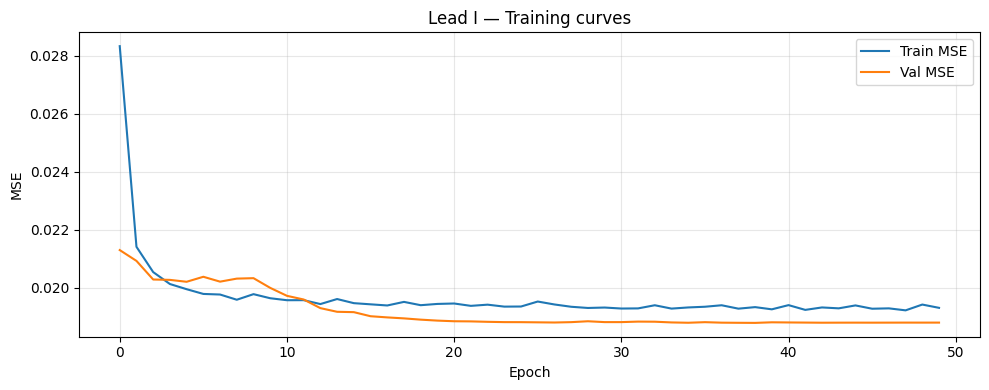

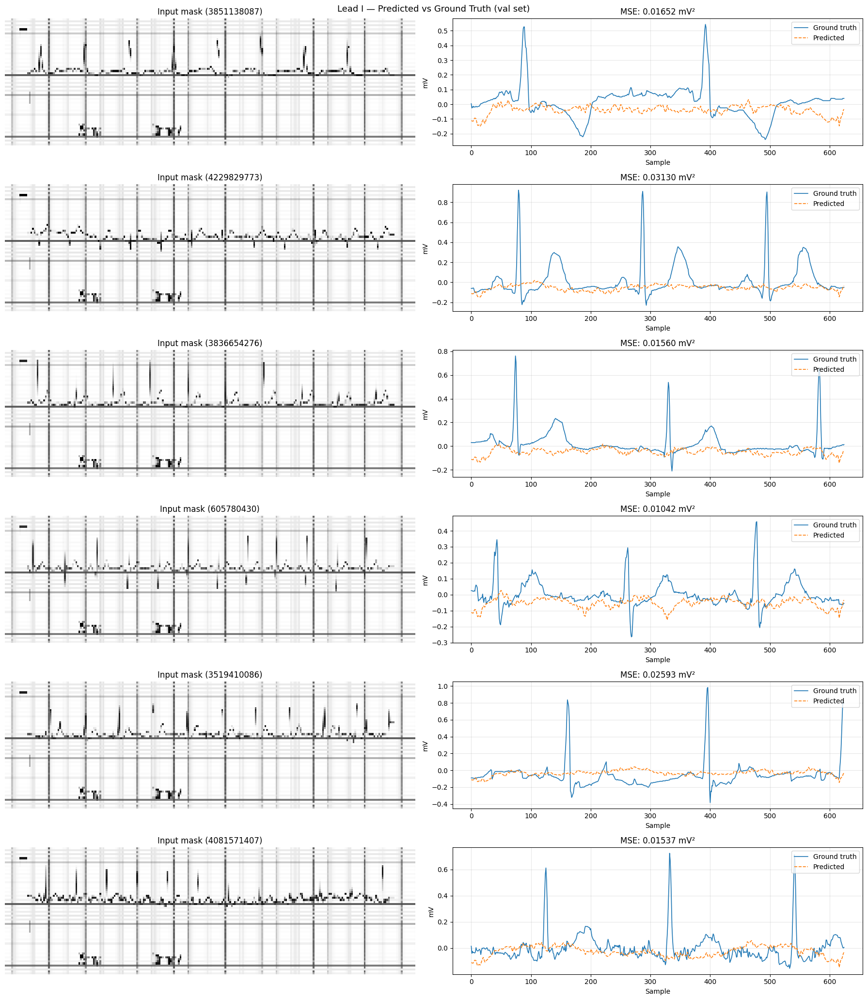

In [182]:
# Load best checkpoint
ckpt = torch.load(CHECKPOINT_DIR / "best_model_leadI.pt", map_location=DEVICE)
model.load_state_dict(ckpt["model_state"])
model.eval()

# Plot loss curves
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(train_losses, label="Train MSE")
ax.plot(val_losses,   label="Val MSE")
ax.set_xlabel("Epoch")
ax.set_ylabel("MSE")
ax.set_title("Lead I — Training curves")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Plot predictions vs ground truth on 6 random val samples
fig, axes = plt.subplots(6, 2, figsize=(18, 3.5 * 6))
fig.suptitle("Lead I — Predicted vs Ground Truth (val set)", fontsize=13)
sample_rows = val_df.sample(6, random_state=0).reset_index(drop=True)

for i, row in sample_rows.iterrows():
    img = cv2.imread(row["chunk_path"], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (IMG_W, IMG_H)).astype(np.float32) / 255.0
    tensor = torch.from_numpy(img).unsqueeze(0).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred = model(tensor).squeeze().cpu().numpy()

    df_ts  = pd.read_csv(row["csv_path"])
    gt     = df_ts["I"].dropna().values.astype(np.float32)
    if len(gt) != SAMPLES_PER_LEAD:
        ix = np.linspace(0, len(gt)-1, SAMPLES_PER_LEAD)
        gt = np.interp(ix, np.arange(len(gt)), gt).astype(np.float32)

    mse = float(np.mean((pred - gt)**2))

    axes[i, 0].imshow(img, cmap="gray", aspect="auto")
    axes[i, 0].set_title(f"Input mask ({row['record_id']})")
    axes[i, 0].axis("off")

    axes[i, 1].plot(gt,   label="Ground truth", linewidth=1.2)
    axes[i, 1].plot(pred, label="Predicted",    linewidth=1.2, linestyle="--")
    axes[i, 1].set_title(f"MSE: {mse:.5f} mV²")
    axes[i, 1].set_xlabel("Sample")
    axes[i, 1].set_ylabel("mV")
    axes[i, 1].legend(loc="upper right")
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

This isn't working very well. Let's try to use the second chunk so we don't have to worry about the calibration square wave

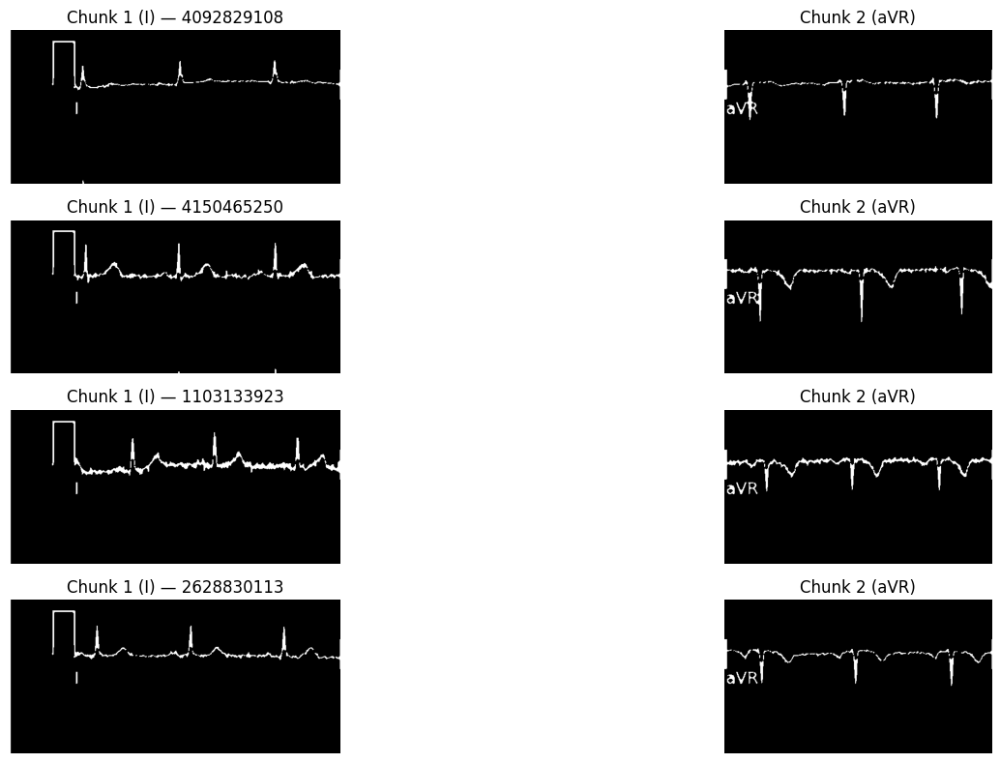

In [183]:
# Check a few chunk 2 images
fig, axes = plt.subplots(4, 2, figsize=(18, 8))
samples = random.sample(sorted(list(CHUNKS_DIR.glob("*_strip_1_chunk_2.png"))), 4)
for i, cp in enumerate(samples):
    chunk1 = cv2.imread(str(cp).replace("chunk_2", "chunk_1"), cv2.IMREAD_GRAYSCALE)
    chunk2 = cv2.imread(str(cp), cv2.IMREAD_GRAYSCALE)
    axes[i, 0].imshow(chunk1, cmap="gray")
    axes[i, 0].set_title(f"Chunk 1 (I) — {Path(cp).stem.split('_Clean')[0]}")
    axes[i, 0].axis("off")
    axes[i, 1].imshow(chunk2, cmap="gray")
    axes[i, 1].set_title("Chunk 2 (aVR)")
    axes[i, 1].axis("off")
plt.tight_layout()
plt.show()

In [184]:
# Build index for lead aVR (strip 1, chunk 2)
rows = []
for chunk_path in sorted(CHUNKS_DIR.glob("*_strip_1_chunk_2.png")):
    record_id = chunk_path.stem.split("_Clean")[0]
    csv_path  = TIMESERIES_DIR / f"{record_id}.csv"
    if not csv_path.exists():
        continue
    if record_chunks[record_id] != 12:
        continue
    rows.append({
        "chunk_path": str(chunk_path),
        "lead":       "aVR",
        "record_id":  record_id,
        "csv_path":   str(csv_path),
    })

index_df = pd.DataFrame(rows)
print(f"Samples for lead aVR: {len(index_df)}")

Samples for lead aVR: 452


In [185]:
def ecg_loss(pred, target, grad_weight=2.0, peak_weight=5.0):
    # Standard MSE
    mse = F.mse_loss(pred, target)
    
    # Gradient loss — penalize missing sharp changes
    grad_pred   = pred[:, 1:]   - pred[:, :-1]
    grad_target = target[:, 1:] - target[:, :-1]
    grad_loss   = F.mse_loss(grad_pred, grad_target)
    
    # Peak loss — weight errors at high amplitude regions more heavily
    amp_weight  = (target.abs() / (target.abs().max(dim=1, keepdim=True).values + 1e-8))
    peak_loss   = (amp_weight * (pred - target) ** 2).mean()
    
    return mse + grad_weight * grad_loss + peak_weight * peak_loss

# Rebuild dataloaders with new index
shuffled     = index_df.sample(frac=1, random_state=42).reset_index(drop=True)
n_val        = max(1, int(len(shuffled) * 0.15))
train_df     = shuffled.iloc[:-n_val]
val_df       = shuffled.iloc[-n_val:]
train_ds     = ECGLeadDataset(train_df, augment=True)
val_ds       = ECGLeadDataset(val_df,   augment=False)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)
print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}")

# Reinitialise model and optimizer
model     = ECGModel().to(DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

best_val_loss  = float("inf")
train_losses, val_losses = [], []

for epoch in range(1, EPOCHS + 1):
    model.train()
    train_loss = 0.0
    for imgs, targets in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        loss = ecg_loss(model(imgs), targets)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)
    train_loss /= len(train_ds)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            val_loss += ecg_loss(model(imgs), targets).item() * imgs.size(0)
    val_loss /= len(val_ds)

    scheduler.step()
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {epoch:3d} | train loss: {train_loss:.6f} | val loss: {val_loss:.6f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "epoch":       epoch,
            "model_state": model.state_dict(),
            "val_loss":    val_loss,
        }, CHECKPOINT_DIR / "best_model_aVR.pt")
        print(f"Saved (val loss {val_loss:.6f})")

print(f"\nDone. Best val loss: {best_val_loss:.6f}")

Train: 385  |  Val: 67


Epoch 1/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.084677 | val loss: 0.069621
Saved (val loss 0.069621)


Epoch 2/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.074813 | val loss: 0.071882


Epoch 3/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.069350 | val loss: 0.063231
Saved (val loss 0.063231)


Epoch 4/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.057434 | val loss: 0.053252
Saved (val loss 0.053252)


Epoch 5/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.062844 | val loss: 0.045203
Saved (val loss 0.045203)


Epoch 6/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.074369 | val loss: 0.051844


Epoch 7/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.066145 | val loss: 0.054508


Epoch 8/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.057526 | val loss: 0.056399


Epoch 9/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.059735 | val loss: 0.049514


Epoch 10/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.056202 | val loss: 0.044559
Saved (val loss 0.044559)


Epoch 11/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.059286 | val loss: 0.050133


Epoch 12/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.057094 | val loss: 0.054074


Epoch 13/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.067119 | val loss: 0.055679


Epoch 14/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.061935 | val loss: 0.051042


Epoch 15/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.056855 | val loss: 0.052366


Epoch 16/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.055123 | val loss: 0.057658


Epoch 17/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.055158 | val loss: 0.059516


Epoch 18/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.054775 | val loss: 0.051884


Epoch 19/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.054893 | val loss: 0.051237


Epoch 20/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.054509 | val loss: 0.048492


Epoch 21/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.054182 | val loss: 0.048868


Epoch 22/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.053501 | val loss: 0.052567


Epoch 23/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.054144 | val loss: 0.053523


Epoch 24/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.053558 | val loss: 0.052535


Epoch 25/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.053728 | val loss: 0.051800


Epoch 26/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.053645 | val loss: 0.047875


Epoch 27/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.054990 | val loss: 0.048903


Epoch 28/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.053362 | val loss: 0.049748


Epoch 29/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.054489 | val loss: 0.052335


Epoch 30/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.053215 | val loss: 0.049944


Epoch 31/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.052883 | val loss: 0.050691


Epoch 32/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.053134 | val loss: 0.052924


Epoch 33/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.052690 | val loss: 0.052353


Epoch 34/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.052629 | val loss: 0.051643


Epoch 35/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.053449 | val loss: 0.050875


Epoch 36/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.054419 | val loss: 0.052768


Epoch 37/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.053428 | val loss: 0.053241


Epoch 38/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.052812 | val loss: 0.052933


Epoch 39/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.052173 | val loss: 0.052465


Epoch 40/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.052502 | val loss: 0.051947


Epoch 41/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.052731 | val loss: 0.052611


Epoch 42/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.053116 | val loss: 0.052842


Epoch 43/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.052842 | val loss: 0.051517


Epoch 44/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.052071 | val loss: 0.051516


Epoch 45/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.052432 | val loss: 0.051606


Epoch 46/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.052850 | val loss: 0.051957


Epoch 47/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.052614 | val loss: 0.052362


Epoch 48/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.052742 | val loss: 0.052474


Epoch 49/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.052465 | val loss: 0.052390


Epoch 50/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.052608 | val loss: 0.052261

Done. Best val loss: 0.044559


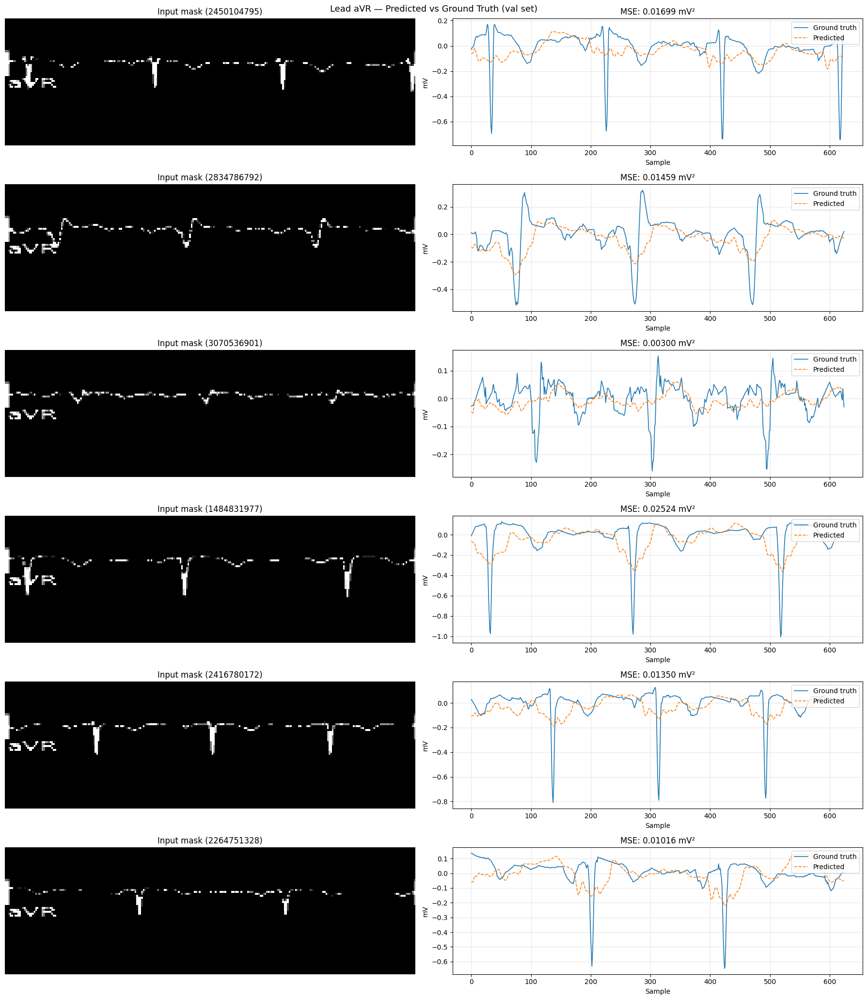

In [186]:
ckpt = torch.load(CHECKPOINT_DIR / "best_model_aVR.pt", map_location=DEVICE)
model.load_state_dict(ckpt["model_state"])
model.eval()

fig, axes = plt.subplots(6, 2, figsize=(18, 3.5 * 6))
fig.suptitle("Lead aVR — Predicted vs Ground Truth (val set)", fontsize=13)
sample_rows = val_df.sample(6, random_state=0).reset_index(drop=True)

for i, row in sample_rows.iterrows():
    img = cv2.imread(row["chunk_path"], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (IMG_W, IMG_H)).astype(np.float32) / 255.0
    tensor = torch.from_numpy(img).unsqueeze(0).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred = model(tensor).squeeze().cpu().numpy()

    df_ts = pd.read_csv(row["csv_path"])
    gt    = df_ts["aVR"].dropna().values.astype(np.float32)
    if len(gt) != SAMPLES_PER_LEAD:
        ix = np.linspace(0, len(gt)-1, SAMPLES_PER_LEAD)
        gt = np.interp(ix, np.arange(len(gt)), gt).astype(np.float32)

    mse = float(np.mean((pred - gt)**2))

    axes[i, 0].imshow(img, cmap="gray", aspect="auto")
    axes[i, 0].set_title(f"Input mask ({row['record_id']})")
    axes[i, 0].axis("off")

    axes[i, 1].plot(gt,   label="Ground truth", linewidth=1.2)
    axes[i, 1].plot(pred, label="Predicted",    linewidth=1.2, linestyle="--")
    axes[i, 1].set_title(f"MSE: {mse:.5f} mV²")
    axes[i, 1].set_xlabel("Sample")
    axes[i, 1].set_ylabel("mV")
    axes[i, 1].legend(loc="upper right")
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

This does not look good at all. The masks are quite blurry and have missing sections in them

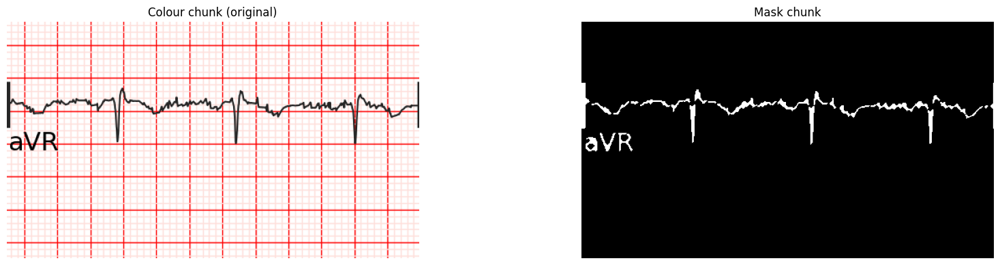

In [187]:
sample_mask_path = random.choice(sorted(CHUNKS_DIR.glob("*_strip_1_chunk_2.png")))
# Reconstruct the original colour strip chunk path
# e.g. 32650710_Clean_strip_1_chunk_2.png → need the colour version
# But we only saved mask chunks — we need to re-chunk from the colour strips

sample_strip_path = STRIPS_DIR / sample_mask_path.name.replace("_chunk_2", "").replace("_strip_1", "_strip_1")
sample_strip      = cv2.imread(str(sample_strip_path))
split_points      = find_split_points(sample_strip)

if len(split_points) == 3:
    bounds = [0] + split_points + [sample_strip.shape[1]]
    chunk_colour = sample_strip[:, bounds[1]:bounds[2]]  # chunk 2
    chunk_mask   = cv2.imread(str(sample_mask_path), cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(1, 2, figsize=(18, 4))
    axes[0].imshow(cv2.cvtColor(chunk_colour, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Colour chunk (original)")
    axes[0].axis("off")
    axes[1].imshow(chunk_mask, cmap="gray")
    axes[1].set_title("Mask chunk")
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

In [188]:
COLOUR_CHUNKS_DIR = DATA_ROOT / "Colour_Chunks"
COLOUR_CHUNKS_DIR.mkdir(parents=True, exist_ok=True)

errors = []
total  = 0
for strip_path in tqdm(sorted(STRIPS_DIR.glob("*.png")), desc="Saving colour chunks"):
    strip_idx = int(strip_path.stem.split("_strip_")[1])
    if strip_idx == 4:
        continue

    strip        = cv2.imread(str(strip_path))
    split_points = find_split_points(strip)

    if len(split_points) != 3:
        errors.append((strip_path.name, f"got {len(split_points)} split points"))
        continue

    bounds = [0] + split_points + [strip.shape[1]]
    stem   = strip_path.stem
    for i in range(len(bounds) - 1):
        x1, x2   = bounds[i], bounds[i+1]
        chunk     = strip[:, x1:x2]
        out_path  = COLOUR_CHUNKS_DIR / f"{stem}_chunk_{i+1}.png"
        cv2.imwrite(str(out_path), chunk)
        total += 1

print(f"Saved {total} colour chunks")
print(f"Errors: {len(errors)}")

Saving colour chunks:   0%|          | 0/2400 [00:00<?, ?it/s]

Saved 7056 colour chunks
Errors: 36


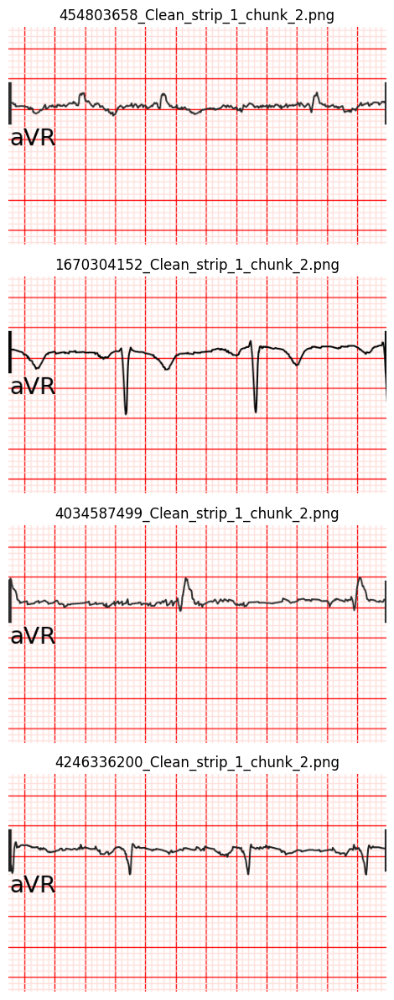

In [189]:
fig, axes = plt.subplots(4, 1, figsize=(18, 12))
samples = random.sample(sorted(list(COLOUR_CHUNKS_DIR.glob("*_strip_1_chunk_2.png"))), 4)
for i, cp in enumerate(samples):
    img = cv2.cvtColor(cv2.imread(str(cp)), cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].set_title(cp.name)
    axes[i].axis("off")
plt.tight_layout()
plt.show()

In [190]:
# Updated dataset for colour chunks
class ECGLeadDataset(Dataset):
    def __init__(self, df, augment=False):
        self.df      = df.reset_index(drop=True)
        self.augment = augment
        self._csv_cache = {}

    def __len__(self):
        return len(self.df)

    def _load_csv(self, path):
        if path not in self._csv_cache:
            self._csv_cache[path] = pd.read_csv(path)
        return self._csv_cache[path]

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img = cv2.imread(row["chunk_path"])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (IMG_W, IMG_H), interpolation=cv2.INTER_AREA)
        img = img.astype(np.float32) / 255.0  # [H, W, 3]

        if self.augment:
            img = np.clip(img + np.random.uniform(-0.05, 0.05), 0, 1)

        img_tensor = torch.from_numpy(img).permute(2, 0, 1)  # [3, H, W]

        df_ts   = self._load_csv(row["csv_path"])
        ts_vals = df_ts[row["lead"]].dropna().values.astype(np.float32)
        if len(ts_vals) != SAMPLES_PER_LEAD:
            ix      = np.linspace(0, len(ts_vals) - 1, SAMPLES_PER_LEAD)
            ts_vals = np.interp(ix, np.arange(len(ts_vals)), ts_vals).astype(np.float32)

        return img_tensor, torch.from_numpy(ts_vals)


# Rebuild index pointing at colour chunks
rows = []
for chunk_path in sorted(COLOUR_CHUNKS_DIR.glob("*_strip_1_chunk_2.png")):
    record_id = chunk_path.stem.split("_Clean")[0]
    csv_path  = TIMESERIES_DIR / f"{record_id}.csv"
    if not csv_path.exists():
        continue
    if record_chunks[record_id] != 12:
        continue
    rows.append({
        "chunk_path": str(chunk_path),
        "lead":       "aVR",
        "record_id":  record_id,
        "csv_path":   str(csv_path),
    })

index_df = pd.DataFrame(rows)
print(f"Samples for lead aVR: {len(index_df)}")

# Update model to accept 3 input channels
class ECGEncoder(nn.Module):
    def __init__(self, base_ch=32, in_ch=3):
        super().__init__()
        bc = base_ch
        self.net = nn.Sequential(
            ConvBlock(in_ch, bc,   stride=(2, 1)),
            ConvBlock(bc,   bc*2, stride=(2, 1)),
            ConvBlock(bc*2, bc*4, stride=(2, 1)),
            ConvBlock(bc*4, bc*8, stride=(2, 1)),
            ConvBlock(bc*8, bc*8, stride=(2, 1)),
            ConvBlock(bc*8, bc*8, stride=(2, 1)),
        )
        self.out_ch = bc * 8

    def forward(self, x): return self.net(x)

class ECGModel(nn.Module):
    def __init__(self, base_ch=32):
        super().__init__()
        self.encoder = ECGEncoder(base_ch, in_ch=3)
        self.decoder = ECGDecoder(self.encoder.out_ch)

    def forward(self, x):
        return self.decoder(self.encoder(x))

# Smoke test
model  = ECGModel().to(DEVICE)
dummy  = torch.zeros(2, 3, IMG_H, IMG_W).to(DEVICE)
out    = model(dummy)
n_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Input : {dummy.shape}")
print(f"Output: {out.shape}")
print(f"Params: {n_params:,}")

Samples for lead aVR: 452
Input : torch.Size([2, 3, 64, 256])
Output: torch.Size([2, 625])
Params: 1,774,881


In [191]:
def ecg_loss(pred, target, grad_weight=2.0, peak_weight=5.0):
    # Standard MSE
    mse = F.mse_loss(pred, target)
    
    # Gradient loss — penalize missing sharp changes
    grad_pred   = pred[:, 1:]   - pred[:, :-1]
    grad_target = target[:, 1:] - target[:, :-1]
    grad_loss   = F.mse_loss(grad_pred, grad_target)
    
    # Peak loss — weight errors at high amplitude regions more heavily
    amp_weight  = (target.abs() / (target.abs().max(dim=1, keepdim=True).values + 1e-8))
    peak_loss   = (amp_weight * (pred - target) ** 2).mean()
    
    return mse + grad_weight * grad_loss + peak_weight * peak_loss

# Rebuild dataloaders with new index
shuffled     = index_df.sample(frac=1, random_state=42).reset_index(drop=True)
n_val        = max(1, int(len(shuffled) * 0.15))
train_df     = shuffled.iloc[:-n_val]
val_df       = shuffled.iloc[-n_val:]
train_ds     = ECGLeadDataset(train_df, augment=True)
val_ds       = ECGLeadDataset(val_df,   augment=False)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)
print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}")

# Reinitialise model and optimizer
model     = ECGModel().to(DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

best_val_loss  = float("inf")
train_losses, val_losses = [], []

for epoch in range(1, EPOCHS + 1):
    model.train()
    train_loss = 0.0
    for imgs, targets in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        loss = ecg_loss(model(imgs), targets)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)
    train_loss /= len(train_ds)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            val_loss += ecg_loss(model(imgs), targets).item() * imgs.size(0)
    val_loss /= len(val_ds)

    scheduler.step()
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {epoch:3d} | train loss: {train_loss:.6f} | val loss: {val_loss:.6f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "epoch":       epoch,
            "model_state": model.state_dict(),
            "val_loss":    val_loss,
        }, CHECKPOINT_DIR / "best_model_aVR.pt")
        print(f"Saved (val loss {val_loss:.6f})")

print(f"\nDone. Best val loss: {best_val_loss:.6f}") 

Train: 385  |  Val: 67


Epoch 1/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.044357 | val loss: 0.068677
Saved (val loss 0.068677)


Epoch 2/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.026772 | val loss: 0.070917


Epoch 3/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.019173 | val loss: 0.033000
Saved (val loss 0.033000)


Epoch 4/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.010487 | val loss: 0.017143
Saved (val loss 0.017143)


Epoch 5/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.012024 | val loss: 0.011827
Saved (val loss 0.011827)


Epoch 6/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.016962 | val loss: 0.008567
Saved (val loss 0.008567)


Epoch 7/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.008455 | val loss: 0.009209


Epoch 8/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.004907 | val loss: 0.008044
Saved (val loss 0.008044)


Epoch 9/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.005773 | val loss: 0.008980


Epoch 10/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.004573 | val loss: 0.008315


Epoch 11/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.003635 | val loss: 0.007716
Saved (val loss 0.007716)


Epoch 12/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.003425 | val loss: 0.008030


Epoch 13/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.003499 | val loss: 0.007962


Epoch 14/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.003212 | val loss: 0.008899


Epoch 15/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.002934 | val loss: 0.007600
Saved (val loss 0.007600)


Epoch 16/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.003188 | val loss: 0.009199


Epoch 17/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.002872 | val loss: 0.007909


Epoch 18/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.003185 | val loss: 0.008937


Epoch 19/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.003102 | val loss: 0.008392


Epoch 20/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.002642 | val loss: 0.006787
Saved (val loss 0.006787)


Epoch 21/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.002576 | val loss: 0.008562


Epoch 22/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.002666 | val loss: 0.007604


Epoch 23/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.002607 | val loss: 0.007182


Epoch 24/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.002482 | val loss: 0.007522


Epoch 25/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.002557 | val loss: 0.007848


Epoch 26/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.002572 | val loss: 0.007922


Epoch 27/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.002431 | val loss: 0.007082


Epoch 28/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.002338 | val loss: 0.007367


Epoch 29/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.002275 | val loss: 0.007718


Epoch 30/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.002232 | val loss: 0.007543


Epoch 31/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.002259 | val loss: 0.007791


Epoch 32/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.002267 | val loss: 0.007333


Epoch 33/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.002207 | val loss: 0.007636


Epoch 34/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.002716 | val loss: 0.007917


Epoch 35/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.002438 | val loss: 0.007502


Epoch 36/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.002425 | val loss: 0.007062


Epoch 37/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.002259 | val loss: 0.007099


Epoch 38/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.002226 | val loss: 0.007229


Epoch 39/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.002165 | val loss: 0.007356


Epoch 40/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.002143 | val loss: 0.007478


Epoch 41/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.002148 | val loss: 0.007445


Epoch 42/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.002134 | val loss: 0.007422


Epoch 43/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.002115 | val loss: 0.007424


Epoch 44/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.002093 | val loss: 0.007364


Epoch 45/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.002128 | val loss: 0.007477


Epoch 46/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.002108 | val loss: 0.007571


Epoch 47/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.002067 | val loss: 0.007516


Epoch 48/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.002097 | val loss: 0.007418


Epoch 49/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.002074 | val loss: 0.007459


Epoch 50/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.002066 | val loss: 0.007450

Done. Best val loss: 0.006787


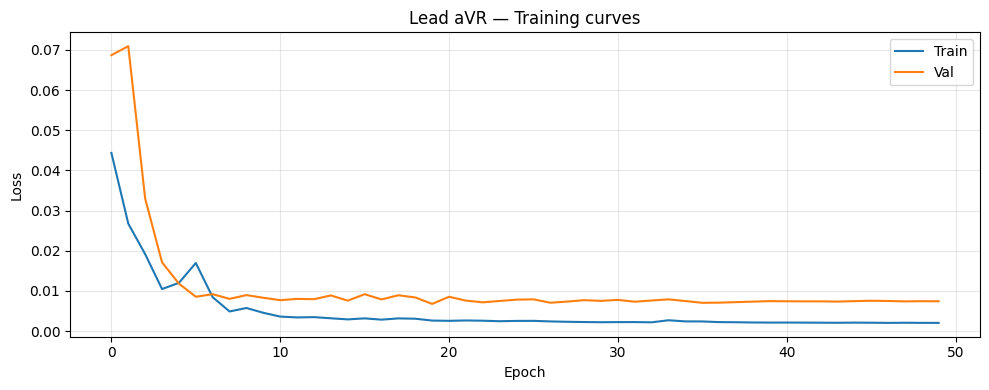

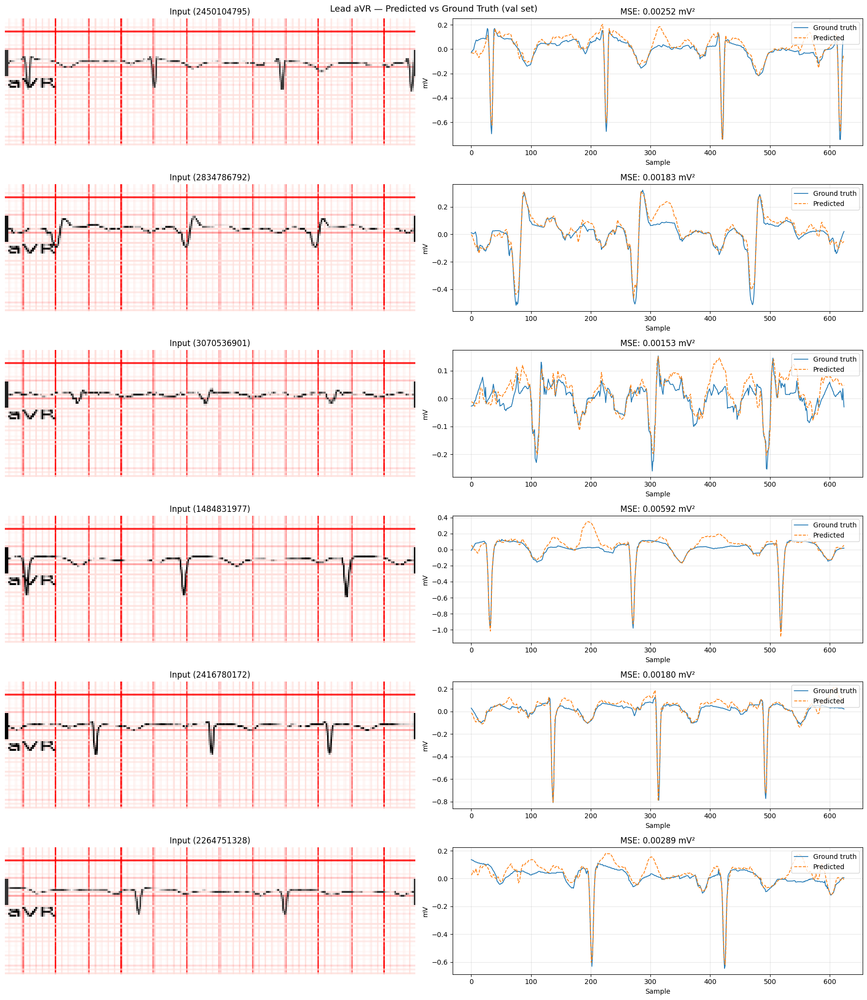

In [192]:
ckpt = torch.load(CHECKPOINT_DIR / "best_model_aVR.pt", map_location=DEVICE)
model.load_state_dict(ckpt["model_state"])
model.eval()

# Loss curves
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(train_losses, label="Train")
ax.plot(val_losses,   label="Val")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.set_title("Lead aVR — Training curves")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Predictions vs ground truth
fig, axes = plt.subplots(6, 2, figsize=(18, 3.5 * 6))
fig.suptitle("Lead aVR — Predicted vs Ground Truth (val set)", fontsize=13)
sample_rows = val_df.sample(6, random_state=0).reset_index(drop=True)

for i, row in sample_rows.iterrows():
    img    = cv2.imread(row["chunk_path"])
    img    = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img    = cv2.resize(img, (IMG_W, IMG_H)).astype(np.float32) / 255.0
    tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred = model(tensor).squeeze().cpu().numpy()

    df_ts = pd.read_csv(row["csv_path"])
    gt    = df_ts["aVR"].dropna().values.astype(np.float32)
    if len(gt) != SAMPLES_PER_LEAD:
        ix = np.linspace(0, len(gt)-1, SAMPLES_PER_LEAD)
        gt = np.interp(ix, np.arange(len(gt)), gt).astype(np.float32)

    mse = float(np.mean((pred - gt)**2))

    axes[i, 0].imshow(img, aspect="auto")
    axes[i, 0].set_title(f"Input ({row['record_id']})")
    axes[i, 0].axis("off")

    axes[i, 1].plot(gt,   label="Ground truth", linewidth=1.2)
    axes[i, 1].plot(pred, label="Predicted",    linewidth=1.2, linestyle="--")
    axes[i, 1].set_title(f"MSE: {mse:.5f} mV²")
    axes[i, 1].set_xlabel("Sample")
    axes[i, 1].set_ylabel("mV")
    axes[i, 1].legend(loc="upper right")
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [193]:
def ecg_loss(pred, target, grad_weight=2.0, peak_weight=5.0, smooth_weight=0.1):
    # Standard MSE
    mse = F.mse_loss(pred, target)
    
    # Gradient loss — penalize missing sharp changes
    grad_pred   = pred[:, 1:]   - pred[:, :-1]
    grad_target = target[:, 1:] - target[:, :-1]
    grad_loss   = F.mse_loss(grad_pred, grad_target)
    
    # Peak loss — weight errors at high amplitude regions more heavily
    amp_weight = (target.abs() / (target.abs().max(dim=1, keepdim=True).values + 1e-8))
    peak_loss  = (amp_weight * (pred - target) ** 2).mean()
    
    # Smoothness loss — penalize second derivative of prediction
    smooth_loss = ((grad_pred[:, 1:] - grad_pred[:, :-1]) ** 2).mean()
    
    return mse + grad_weight * grad_loss + peak_weight * peak_loss + smooth_weight * smooth_loss

# Rebuild dataloaders with new index
shuffled     = index_df.sample(frac=1, random_state=42).reset_index(drop=True)
n_val        = max(1, int(len(shuffled) * 0.15))
train_df     = shuffled.iloc[:-n_val]
val_df       = shuffled.iloc[-n_val:]
train_ds     = ECGLeadDataset(train_df, augment=True)
val_ds       = ECGLeadDataset(val_df,   augment=False)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)
print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}")

# Reinitialise model and optimizer
model     = ECGModel().to(DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

best_val_loss  = float("inf")
train_losses, val_losses = [], []

for epoch in range(1, EPOCHS + 1):
    model.train()
    train_loss = 0.0
    for imgs, targets in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        loss = ecg_loss(model(imgs), targets)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)
    train_loss /= len(train_ds)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            val_loss += ecg_loss(model(imgs), targets).item() * imgs.size(0)
    val_loss /= len(val_ds)

    scheduler.step()
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {epoch:3d} | train loss: {train_loss:.6f} | val loss: {val_loss:.6f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "epoch":       epoch,
            "model_state": model.state_dict(),
            "val_loss":    val_loss,
        }, CHECKPOINT_DIR / "best_model_aVR.pt")
        print(f"Saved (val loss {val_loss:.6f})")

print(f"\nDone. Best val loss: {best_val_loss:.6f}") 

Train: 385  |  Val: 67


Epoch 1/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.039405 | val loss: 0.069912
Saved (val loss 0.069912)


Epoch 2/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.023076 | val loss: 0.073246


Epoch 3/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.014228 | val loss: 0.030918
Saved (val loss 0.030918)


Epoch 4/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.010499 | val loss: 0.012094
Saved (val loss 0.012094)


Epoch 5/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.017196 | val loss: 0.011384
Saved (val loss 0.011384)


Epoch 6/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.006902 | val loss: 0.010644
Saved (val loss 0.010644)


Epoch 7/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.013718 | val loss: 0.010035
Saved (val loss 0.010035)


Epoch 8/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.006560 | val loss: 0.008369
Saved (val loss 0.008369)


Epoch 9/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.005806 | val loss: 0.009794


Epoch 10/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.006315 | val loss: 0.008361
Saved (val loss 0.008361)


Epoch 11/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.004390 | val loss: 0.009708


Epoch 12/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.004861 | val loss: 0.008688


Epoch 13/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.003577 | val loss: 0.009308


Epoch 14/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.004240 | val loss: 0.009793


Epoch 15/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.004033 | val loss: 0.008247
Saved (val loss 0.008247)


Epoch 16/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.008818 | val loss: 0.008580


Epoch 17/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.003173 | val loss: 0.007957
Saved (val loss 0.007957)


Epoch 18/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.003442 | val loss: 0.008126


Epoch 19/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.003420 | val loss: 0.012858


Epoch 20/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.002894 | val loss: 0.008550


Epoch 21/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.002918 | val loss: 0.007899
Saved (val loss 0.007899)


Epoch 22/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.002709 | val loss: 0.007589
Saved (val loss 0.007589)


Epoch 23/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.002579 | val loss: 0.007615


Epoch 24/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.002527 | val loss: 0.008106


Epoch 25/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.002579 | val loss: 0.008823


Epoch 26/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.002501 | val loss: 0.007574
Saved (val loss 0.007574)


Epoch 27/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.002402 | val loss: 0.007659


Epoch 28/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.002330 | val loss: 0.007741


Epoch 29/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.002284 | val loss: 0.007488
Saved (val loss 0.007488)


Epoch 30/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.002374 | val loss: 0.007852


Epoch 31/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.002312 | val loss: 0.007833


Epoch 32/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.002975 | val loss: 0.008468


Epoch 33/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.004995 | val loss: 0.012789


Epoch 34/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.003245 | val loss: 0.006974
Saved (val loss 0.006974)


Epoch 35/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.003829 | val loss: 0.006527
Saved (val loss 0.006527)


Epoch 36/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.002827 | val loss: 0.006888


Epoch 37/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.002446 | val loss: 0.007192


Epoch 38/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.002910 | val loss: 0.007315


Epoch 39/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.003053 | val loss: 0.007275


Epoch 40/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.002536 | val loss: 0.007304


Epoch 41/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.002441 | val loss: 0.007104


Epoch 42/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.002315 | val loss: 0.007013


Epoch 43/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.002327 | val loss: 0.007014


Epoch 44/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.002284 | val loss: 0.006967


Epoch 45/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.002316 | val loss: 0.006998


Epoch 46/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.002301 | val loss: 0.007019


Epoch 47/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.002267 | val loss: 0.007013


Epoch 48/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.002259 | val loss: 0.006993


Epoch 49/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.002297 | val loss: 0.006993


Epoch 50/50:   0%|          | 0/13 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.002260 | val loss: 0.007018

Done. Best val loss: 0.006527


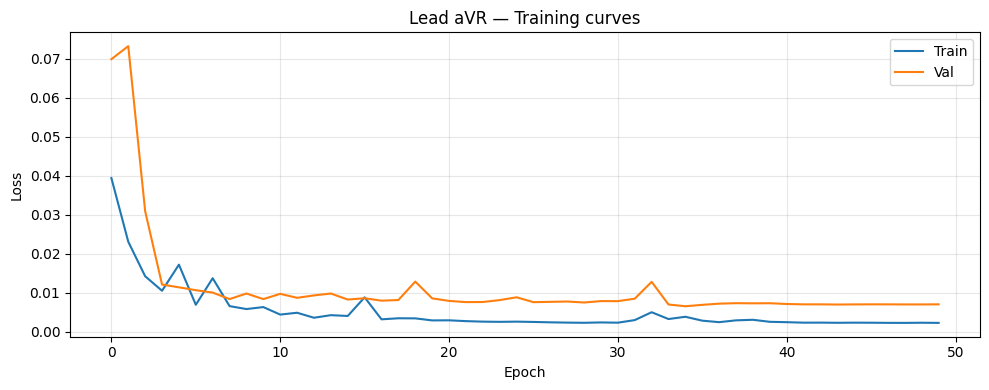

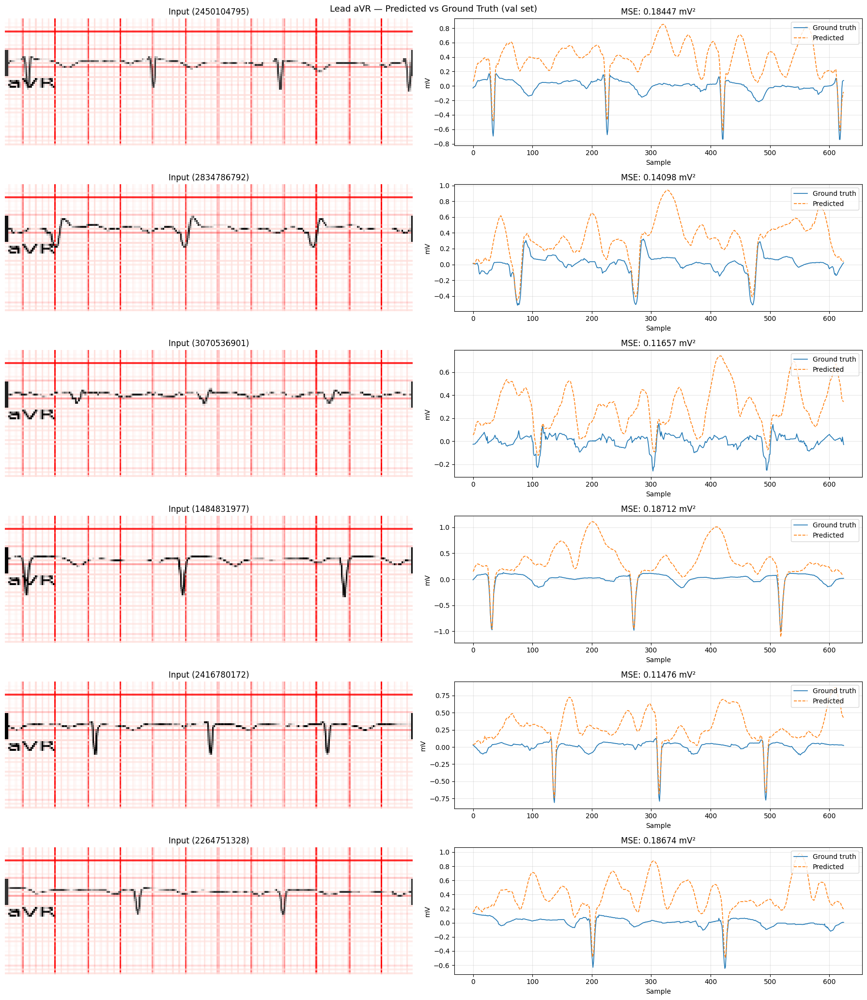

In [194]:
ckpt = torch.load(CHECKPOINT_DIR / "best_model_aVR.pt", map_location=DEVICE)
model.load_state_dict(ckpt["model_state"])
model.eval()

# Loss curves
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(train_losses, label="Train")
ax.plot(val_losses,   label="Val")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.set_title("Lead aVR — Training curves")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Predictions vs ground truth
fig, axes = plt.subplots(6, 2, figsize=(18, 3.5 * 6))
fig.suptitle("Lead aVR — Predicted vs Ground Truth (val set)", fontsize=13)
sample_rows = val_df.sample(6, random_state=0).reset_index(drop=True)

for i, row in sample_rows.iterrows():
    img    = cv2.imread(row["chunk_path"])
    img    = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img    = cv2.resize(img, (IMG_W, IMG_H)).astype(np.float32) / 255.0
    tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred = model(tensor).squeeze().cpu().numpy()

    df_ts = pd.read_csv(row["csv_path"])
    gt    = df_ts["aVR"].dropna().values.astype(np.float32)
    if len(gt) != SAMPLES_PER_LEAD:
        ix = np.linspace(0, len(gt)-1, SAMPLES_PER_LEAD)
        gt = np.interp(ix, np.arange(len(gt)), gt).astype(np.float32)

    mse = float(np.mean((pred - gt)**2))

    axes[i, 0].imshow(img, aspect="auto")
    axes[i, 0].set_title(f"Input ({row['record_id']})")
    axes[i, 0].axis("off")

    axes[i, 1].plot(gt,   label="Ground truth", linewidth=1.2)
    axes[i, 1].plot(pred, label="Predicted",    linewidth=1.2, linestyle="--")
    axes[i, 1].set_title(f"MSE: {mse:.5f} mV²")
    axes[i, 1].set_xlabel("Sample")
    axes[i, 1].set_ylabel("mV")
    axes[i, 1].legend(loc="upper right")
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Crop the images

Found 2400 strips


Cropping chunks:   0%|          | 0/1764 [00:00<?, ?it/s]


Saved 1666 cropped chunks to Data/training/Colour_Chunks
Errors: 98
  1048962695_Clean_strip_3_chunk_1.png: Not enough spike cols
  1103158012_Clean_strip_3_chunk_1.png: Not enough spike cols
  1151562032_Clean_strip_3_chunk_1.png: Not enough spike cols
  1154001412_Clean_strip_3_chunk_1.png: Not enough spike cols
  1163641242_Clean_strip_3_chunk_1.png: Not enough spike cols
  1174117563_Clean_strip_3_chunk_1.png: Not enough spike cols
  1254751446_Clean_strip_3_chunk_1.png: Not enough spike cols
  1289824484_Clean_strip_3_chunk_1.png: Not enough spike cols
  133948617_Clean_strip_3_chunk_1.png: Not enough spike cols
  145399852_Clean_strip_3_chunk_1.png: Not enough spike cols


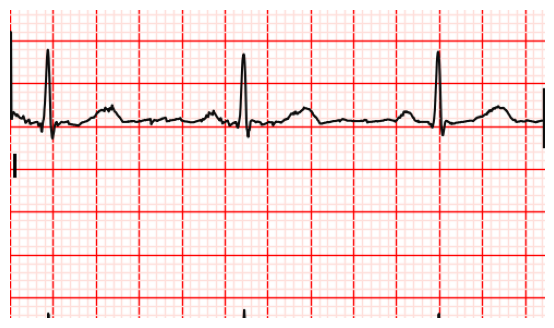

In [195]:
def crop_left_edge(chunk_path):
    strip_idx = int(chunk_path.stem.split("_")[-1])
    if strip_idx != 1:
        return None, "Not Left Chunk"  #we only do chunk 1
    
    chunk = cv2.imread(str(chunk_path))

    b, g, r = cv2.split(chunk)
    is_black = (r < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (b < BLACK_THRESHOLD)
    col_sums = is_black.sum(axis=0).astype(float)

    spike_cols = np.where(col_sums > 80)[0]
    if len(spike_cols) <= 3:
        return None, "Not enough spike cols"
    # if len(spike_cols) == 2:
    #     crop_point = spike_cols[1]
    #     print("Too few spike_cols")
    else:
        crop_point = spike_cols[3]

    
    cropped_chunk = chunk[:, crop_point:]
    cv2.imwrite(str(chunk_path), cropped_chunk)
    return(str(chunk_path), None)



# Run on all strips
chunk1s = sorted(COLOUR_CHUNKS_DIR.glob("*_chunk_1.png"))
print(f"Found {len(strip_paths)} strips")

errors = []
total  = 0
for strip_path in tqdm(chunk1s, desc="Cropping chunks"):
    saved, err = crop_left_edge(strip_path)
    if err:
        errors.append((strip_path.name, err))
    else:
        total += 1

print(f"\nSaved {total} cropped chunks to {COLOUR_CHUNKS_DIR}")
print(f"Errors: {len(errors)}")
if errors:
    for name, err in errors[:10]:
        print(f"  {name}: {err}")
# Visual check
sample_strip_path = random.choice(sorted(COLOUR_CHUNKS_DIR.glob("*_strip_1_chunk_1.png")))
sample_strip      = cv2.imread(str(sample_strip_path))
vis = cv2.cvtColor(sample_strip, cv2.COLOR_BGR2RGB).copy()


plt.figure(figsize=(18, 4))
plt.imshow(vis)
plt.axis("off")
plt.show()

Found 2400 strips


Cropping chunks:   0%|          | 0/1764 [00:00<?, ?it/s]


Saved 1764 cropped chunks to Data/training/Colour_Chunks
Errors: 0


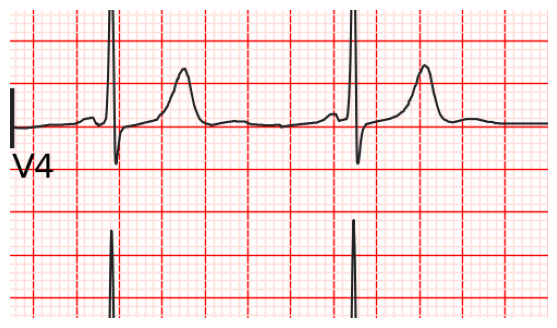

In [196]:
def crop_right_edge(chunk_path):
    strip_idx = int(chunk_path.stem.split("_")[-1])
    if strip_idx != 4:
        return None, "Not Right Chunk"  #we only do chunk 4
    
    chunk = cv2.imread(str(chunk_path))

    b, g, r = cv2.split(chunk)
    is_black = (r < BLACK_THRESHOLD) & (g < BLACK_THRESHOLD) & (b < BLACK_THRESHOLD)
    col_sums = is_black.sum(axis=0).astype(float)

    blank_cols = np.where(col_sums == 0)[0]

    # Group consecutive blank columns, looking for only groups with length at least 25
    groups = []
    if len(blank_cols) > 0:
        group = [blank_cols[0]]
        for col in blank_cols[1:]:
            if col == group[-1] + 1:
                group.append(col)
            else:
                if len(group) >= 25:
                    groups.append(group)
                group = [col]
        if len(group) >= 25:
            groups.append(group)
    
    #take the first value of the first group
    crop_point = groups[0][0]



    
    cropped_chunk = chunk[:, :crop_point]

    cv2.imwrite(str(chunk_path), cropped_chunk)
    return(str(chunk_path), None)


# Run on all strips
chunk4s = sorted(COLOUR_CHUNKS_DIR.glob("*_chunk_4.png"))
print(f"Found {len(strip_paths)} strips")

errors = []
total  = 0
for strip_path in tqdm(chunk4s, desc="Cropping chunks"):
    saved, err = crop_right_edge(strip_path)
    if err:
        errors.append((strip_path.name, err))
    else:
        total += 1

print(f"\nSaved {total} cropped chunks to {COLOUR_CHUNKS_DIR}")
print(f"Errors: {len(errors)}")
if errors:
    for name, err in errors[:10]:
        print(f"  {name}: {err}")
# Visual check
sample_strip_path = random.choice(sorted(COLOUR_CHUNKS_DIR.glob("*_strip_1_chunk_4.png")))
sample_strip      = cv2.imread(str(sample_strip_path))
vis = cv2.cvtColor(sample_strip, cv2.COLOR_BGR2RGB).copy()


plt.figure(figsize=(18, 4))
plt.imshow(vis)
plt.axis("off")
plt.show()

Get all leads and get validation set data

In [197]:
chunk_to_lead = {"strip_1_chunk_1": "I", "strip_1_chunk_2": "aVR", "strip_1_chunk_3": "V1", "strip_1_chunk_4": "V4", 
                 "strip_2_chunk_1": "II", "strip_2_chunk_2": "aVL", "strip_2_chunk_3": "V2", "strip_2_chunk_4": "V5",
                 "strip_3_chunk_1": "III", "strip_3_chunk_2": "aVF", "strip_3_chunk_3" :"V3", "strip_3_chunk_4": "V6"}


In [199]:
training_csv_dict = {}
for chunk in chunk_to_lead.keys():
    lead = chunk_to_lead[chunk]
    rows = []
    for chunk_path in sorted(COLOUR_CHUNKS_DIR.glob("*_"+ chunk + ".png")):
        record_id = chunk_path.stem.split("_Clean")[0]
        csv_path  = TIMESERIES_DIR / f"{record_id}.csv"
        if not csv_path.exists():
            continue
        if record_chunks[record_id] != 12:
            continue
        rows.append({
            "chunk_path": str(chunk_path),
            "lead":       lead,
            "record_id":  record_id,
            "csv_path":   str(csv_path),
        })

    index_df = pd.DataFrame(rows)
    print(f"Samples for lead {lead}: {len(index_df)}")
    training_csv_dict[lead] = index_df
training_csv_dict["aVR"].head()

Samples for lead I: 452
Samples for lead aVR: 452
Samples for lead V1: 452
Samples for lead V4: 452
Samples for lead II: 453
Samples for lead aVL: 453
Samples for lead V2: 453
Samples for lead V5: 453
Samples for lead III: 454
Samples for lead aVF: 454
Samples for lead V3: 454
Samples for lead V6: 454


,chunk_path,lead,record_id,csv_path
0,Data/training/Colour_Chunks/1015663939_Clean_s...,aVR,1015663939,Data/training/Timeseries/1015663939.csv
1,Data/training/Colour_Chunks/1041099777_Clean_s...,aVR,1041099777,Data/training/Timeseries/1041099777.csv
2,Data/training/Colour_Chunks/1052007218_Clean_s...,aVR,1052007218,Data/training/Timeseries/1052007218.csv
3,Data/training/Colour_Chunks/1059602762_Clean_s...,aVR,1059602762,Data/training/Timeseries/1059602762.csv
4,Data/training/Colour_Chunks/1067975047_Clean_s...,aVR,1067975047,Data/training/Timeseries/1067975047.csv


In [200]:
VAL_DATA_ROOT      = Path("./Data/Development")
VAL_IMAGES_DIR     = VAL_DATA_ROOT / "Clean_Images"
VAL_TIMESERIES_DIR = VAL_DATA_ROOT / "Timeseries"
VAL_STRIPS_DIR     = VAL_DATA_ROOT / "Strips"
VAL_MASKS_DIR      = VAL_DATA_ROOT / "Masks"
VAL_CHUNKS_DIR     = VAL_DATA_ROOT / "Chunks"



Found 150 images


Splitting strips:   0%|          | 0/150 [00:00<?, ?it/s]


Strip count distribution: {4: 150}
Errors: 0


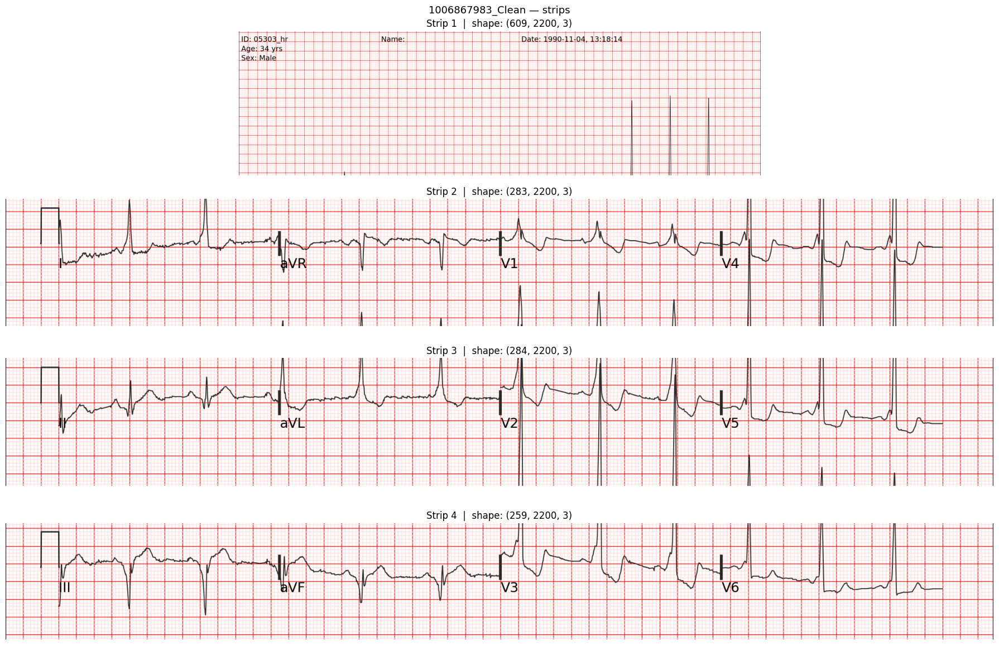

In [201]:
image_paths = sorted(list(VAL_IMAGES_DIR.glob("*.png")) + list(VAL_IMAGES_DIR.glob("*.jpg")))
print(f"Found {len(image_paths)} images")

errors = []
strip_counts = []
for img_path in tqdm(image_paths, desc="Splitting strips"):
    try:
        saved = split_ecg_strips(img_path, VAL_STRIPS_DIR)
        strip_counts.append(len(saved))
    except Exception as e:
        errors.append((img_path.name, str(e)))

print(f"\nStrip count distribution: {pd.Series(strip_counts).value_counts().to_dict()}")
print(f"Errors: {len(errors)}")
if errors:
    for name, err in errors[:5]:
        print(f"  {name}: {err}")

# Visual check
sample_path = image_paths[0]
strip_paths = sorted(VAL_STRIPS_DIR.glob(f"{sample_path.stem}_strip_*.png"))

fig, axes = plt.subplots(len(strip_paths), 1, figsize=(18, 3 * len(strip_paths)))
if len(strip_paths) == 1:
    axes = [axes]
fig.suptitle(f"{sample_path.stem} — strips", fontsize=13)
for i, sp in enumerate(strip_paths):
    strip_img = cv2.cvtColor(cv2.imread(str(sp)), cv2.COLOR_BGR2RGB)
    axes[i].imshow(strip_img)
    axes[i].set_title(f"Strip {i+1}  |  shape: {strip_img.shape}")
    axes[i].axis("off")
plt.tight_layout()
plt.show()

In [202]:
VAL_COLOUR_CHUNKS_DIR = VAL_DATA_ROOT / "Colour_Chunks"
VAL_COLOUR_CHUNKS_DIR.mkdir(parents=True, exist_ok=True)

errors = []
total  = 0
for strip_path in tqdm(sorted(VAL_STRIPS_DIR.glob("*.png")), desc="Saving colour chunks"):
    strip_idx = int(strip_path.stem.split("_strip_")[1])
    if strip_idx == 4:
        continue

    strip        = cv2.imread(str(strip_path))
    split_points = find_split_points(strip)

    if len(split_points) != 3:
        errors.append((strip_path.name, f"got {len(split_points)} split points"))
        continue

    bounds = [0] + split_points + [strip.shape[1]]
    stem   = strip_path.stem
    for i in range(len(bounds) - 1):
        x1, x2   = bounds[i], bounds[i+1]
        chunk     = strip[:, x1:x2]
        out_path  = VAL_COLOUR_CHUNKS_DIR / f"{stem}_chunk_{i+1}.png"
        cv2.imwrite(str(out_path), chunk)
        total += 1

print(f"Saved {total} colour chunks")
print(f"Errors: {len(errors)}")

Saving colour chunks:   0%|          | 0/600 [00:00<?, ?it/s]

Saved 1768 colour chunks
Errors: 8


In [203]:
val_chunk_paths = sorted(VAL_COLOUR_CHUNKS_DIR.glob("*.png"))
print(f"Total chunks: {len(val_chunk_paths)}")

# Count successful records (those with all 12 chunks: 3 strips x 4 chunks)
from collections import defaultdict
val_record_chunks = defaultdict(int)
for cp in val_chunk_paths:
    # e.g. 32650710_Clean_strip_1_mask_chunk_1.png
    record_id = cp.stem.split("_Clean")[0]
    val_record_chunks[record_id] += 1

counts = pd.Series(val_record_chunks.values())
print(f"\nChunk count distribution per record:")
print(counts.value_counts().sort_index())
print(f"\nRecords with all 12 chunks: {(counts == 12).sum()}")
print(f"Total records: {len(val_record_chunks)}")

Total chunks: 1768

Chunk count distribution per record:
8       8
12    142
Name: count, dtype: int64

Records with all 12 chunks: 142
Total records: 150


Crop the validation chunks as well

In [204]:
chunk1s = sorted(VAL_COLOUR_CHUNKS_DIR.glob("*_chunk_1.png"))
print(f"Found {len(strip_paths)} strips")

errors = []
total  = 0
for strip_path in tqdm(chunk1s, desc="Cropping chunks"):
    saved, err = crop_left_edge(strip_path)
    if err:
        errors.append((strip_path.name, err))
    else:
        total += 1

print(f"\nSaved {total} cropped chunks to {VAL_COLOUR_CHUNKS_DIR}")
print(f"Errors: {len(errors)}")
if errors:
    for name, err in errors[:10]:
        print(f"  {name}: {err}")


chunk4s = sorted(VAL_COLOUR_CHUNKS_DIR.glob("*_chunk_4.png"))
print(f"Found {len(strip_paths)} strips")

errors = []
total  = 0
for strip_path in tqdm(chunk4s, desc="Cropping chunks"):
    saved, err = crop_right_edge(strip_path)
    if err:
        errors.append((strip_path.name, err))
    else:
        total += 1

print(f"\nSaved {total} cropped chunks to {VAL_COLOUR_CHUNKS_DIR}")
print(f"Errors: {len(errors)}")
if errors:
    for name, err in errors[:10]:
        print(f"  {name}: {err}")


Found 4 strips


Cropping chunks:   0%|          | 0/442 [00:00<?, ?it/s]


Saved 420 cropped chunks to Data/Development/Colour_Chunks
Errors: 22
  1531629157_Clean_strip_3_chunk_1.png: Not enough spike cols
  1678324396_Clean_strip_3_chunk_1.png: Not enough spike cols
  1868006986_Clean_strip_3_chunk_1.png: Not enough spike cols
  198290386_Clean_strip_3_chunk_1.png: Not enough spike cols
  1998779717_Clean_strip_3_chunk_1.png: Not enough spike cols
  2089312114_Clean_strip_3_chunk_1.png: Not enough spike cols
  2461704588_Clean_strip_3_chunk_1.png: Not enough spike cols
  2546276044_Clean_strip_3_chunk_1.png: Not enough spike cols
  2589114748_Clean_strip_3_chunk_1.png: Not enough spike cols
  2711409608_Clean_strip_3_chunk_1.png: Not enough spike cols
Found 4 strips


Cropping chunks:   0%|          | 0/442 [00:00<?, ?it/s]


Saved 442 cropped chunks to Data/Development/Colour_Chunks
Errors: 0


In [205]:
development_csv_dict = {}
for chunk in chunk_to_lead.keys():
    lead = chunk_to_lead[chunk]
    rows = []
    for chunk_path in sorted(VAL_COLOUR_CHUNKS_DIR.glob("*_"+ chunk + ".png")):
        record_id = chunk_path.stem.split("_Clean")[0]
        csv_path  = VAL_TIMESERIES_DIR / f"{record_id}.csv"
        if not csv_path.exists():
            continue
        if val_record_chunks[record_id] != 12:
            continue
        rows.append({
            "chunk_path": str(chunk_path),
            "lead":       lead,
            "record_id":  record_id,
            "csv_path":   str(csv_path),
        })

    index_df = pd.DataFrame(rows)
    print(f"Samples for lead {lead}: {len(index_df)}")
    development_csv_dict[lead] = index_df
development_csv_dict["aVR"].head()

Samples for lead I: 142
Samples for lead aVR: 142
Samples for lead V1: 142
Samples for lead V4: 142
Samples for lead II: 142
Samples for lead aVL: 142
Samples for lead V2: 142
Samples for lead V5: 142
Samples for lead III: 142
Samples for lead aVF: 142
Samples for lead V3: 142
Samples for lead V6: 142


,chunk_path,lead,record_id,csv_path
0,Data/Development/Colour_Chunks/104573050_Clean...,aVR,104573050,Data/Development/Timeseries/104573050.csv
1,Data/Development/Colour_Chunks/1063816858_Clea...,aVR,1063816858,Data/Development/Timeseries/1063816858.csv
2,Data/Development/Colour_Chunks/108599929_Clean...,aVR,108599929,Data/Development/Timeseries/108599929.csv
3,Data/Development/Colour_Chunks/1135737846_Clea...,aVR,1135737846,Data/Development/Timeseries/1135737846.csv
4,Data/Development/Colour_Chunks/1154813853_Clea...,aVR,1154813853,Data/Development/Timeseries/1154813853.csv


Make lead II be the full bottom strip instead

In [206]:

rows = []
for chunk_path in sorted(STRIPS_DIR.glob("*_strip_4.png")):
    record_id = chunk_path.stem.split("_Clean")[0]
    csv_path  = TIMESERIES_DIR / f"{record_id}.csv"
    if not csv_path.exists():
        continue
    if record_chunks[record_id] != 12:
        continue
    rows.append({
        "chunk_path": str(chunk_path),
        "lead":       "II",
        "record_id":  record_id,
        "csv_path":   str(csv_path),
    })

index_df = pd.DataFrame(rows)
print(f"Training Samples for lead II: {len(index_df)}")
training_csv_dict[lead] = index_df

rows = []
for chunk_path in sorted(VAL_STRIPS_DIR.glob("*_strip_4.png")):
    record_id = chunk_path.stem.split("_Clean")[0]
    csv_path  = VAL_TIMESERIES_DIR / f"{record_id}.csv"
    if not csv_path.exists():
        continue
    if val_record_chunks[record_id] != 12:
        continue
    rows.append({
        "chunk_path": str(chunk_path),
        "lead":       "II",
        "record_id":  record_id,
        "csv_path":   str(csv_path),
    })

index_df = pd.DataFrame(rows)
print(f"Validation Samples for lead II: {len(index_df)}")
development_csv_dict[lead] = index_df
development_csv_dict["II"].head()

Training Samples for lead II: 455
Validation Samples for lead II: 142


,chunk_path,lead,record_id,csv_path
0,Data/Development/Colour_Chunks/104573050_Clean...,II,104573050,Data/Development/Timeseries/104573050.csv
1,Data/Development/Colour_Chunks/1063816858_Clea...,II,1063816858,Data/Development/Timeseries/1063816858.csv
2,Data/Development/Colour_Chunks/108599929_Clean...,II,108599929,Data/Development/Timeseries/108599929.csv
3,Data/Development/Colour_Chunks/1135737846_Clea...,II,1135737846,Data/Development/Timeseries/1135737846.csv
4,Data/Development/Colour_Chunks/1154813853_Clea...,II,1154813853,Data/Development/Timeseries/1154813853.csv


For each lead, run a model trained and tested on only that lead (note: takes about an hour); and also run a model trained and tested on all leads at the same time

In [207]:
train_losses = {}
val_losses = {}
for lead in chunk_to_lead.values():

    # Rebuild dataloaders with new index
    shuffled     = index_df.sample(frac=1, random_state=42).reset_index(drop=True)
    n_val        = max(1, int(len(shuffled) * 0.15))
    train_df     = training_csv_dict[lead]
    val_df       = development_csv_dict[lead]
    train_ds     = ECGLeadDataset(train_df, augment=True)
    val_ds       = ECGLeadDataset(val_df,   augment=False)
    train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
    val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)
    print(f"{lead}: Train: {len(train_ds)}  |  Val: {len(val_ds)}")

    # Reinitialise model and optimizer
    model     = ECGModel().to(DEVICE)
    optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

    best_val_loss  = float("inf")
    train_losses[lead] = []
    val_losses[lead] = []

    for epoch in range(1, EPOCHS + 1):
        model.train()
        train_loss = 0.0
        for imgs, targets in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            loss = ecg_loss(model(imgs), targets)
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            train_loss += loss.item() * imgs.size(0)
        train_loss /= len(train_ds)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
                val_loss += ecg_loss(model(imgs), targets).item() * imgs.size(0)
        val_loss /= len(val_ds)

        scheduler.step()
        train_losses[lead].append(train_loss)
        val_losses[lead].append(val_loss)
        print(f"Epoch {epoch:3d} | train loss: {train_loss:.6f} | val loss: {val_loss:.6f}")

        save_string =  "best_model_"+ lead + ".pt"
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save({
                "epoch":       epoch,
                "model_state": model.state_dict(),
                "val_loss":    val_loss,
            }, CHECKPOINT_DIR / save_string)
            print(f"Saved {lead} (val loss {val_loss:.6f})")

    print(f"\n{lead} Done. Best val loss: {best_val_loss:.6f}") 

I: Train: 452  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.032310 | val loss: 0.099405
Saved I (val loss 0.099405)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.014179 | val loss: 0.053785
Saved I (val loss 0.053785)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.009474 | val loss: 0.012758
Saved I (val loss 0.012758)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.008935 | val loss: 0.010470
Saved I (val loss 0.010470)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.007466 | val loss: 0.008055
Saved I (val loss 0.008055)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.006297 | val loss: 0.007455
Saved I (val loss 0.007455)


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.006707 | val loss: 0.007563


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.005801 | val loss: 0.007155
Saved I (val loss 0.007155)


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.007126 | val loss: 0.007832


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.005541 | val loss: 0.007439


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.005068 | val loss: 0.007471


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.004981 | val loss: 0.007209


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.006212 | val loss: 0.007962


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.006791 | val loss: 0.007689


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.005549 | val loss: 0.007349


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.004598 | val loss: 0.006789
Saved I (val loss 0.006789)


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.004053 | val loss: 0.006903


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.003669 | val loss: 0.006651
Saved I (val loss 0.006651)


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.003505 | val loss: 0.006958


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.003454 | val loss: 0.006650
Saved I (val loss 0.006650)


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.003552 | val loss: 0.006889


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.003357 | val loss: 0.006981


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.003267 | val loss: 0.006787


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.003395 | val loss: 0.006812


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.003369 | val loss: 0.006603
Saved I (val loss 0.006603)


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.003393 | val loss: 0.007049


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.003071 | val loss: 0.006639


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.002997 | val loss: 0.006790


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.002904 | val loss: 0.006526
Saved I (val loss 0.006526)


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.002879 | val loss: 0.006522
Saved I (val loss 0.006522)


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.002903 | val loss: 0.006663


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.002788 | val loss: 0.006598


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.002726 | val loss: 0.006620


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.002676 | val loss: 0.006541


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.002654 | val loss: 0.006471
Saved I (val loss 0.006471)


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.002651 | val loss: 0.006536


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.002894 | val loss: 0.006803


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.002746 | val loss: 0.006516


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.002625 | val loss: 0.006509


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.002566 | val loss: 0.006578


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.002560 | val loss: 0.006523


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.002575 | val loss: 0.006629


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.002520 | val loss: 0.006546


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.002534 | val loss: 0.006536


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.002541 | val loss: 0.006590


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.002510 | val loss: 0.006534


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.002509 | val loss: 0.006547


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.002481 | val loss: 0.006556


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.002484 | val loss: 0.006552


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.002494 | val loss: 0.006551

I Done. Best val loss: 0.006471
aVR: Train: 452  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.037738 | val loss: 0.073804
Saved aVR (val loss 0.073804)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.020502 | val loss: 0.061255
Saved aVR (val loss 0.061255)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.016852 | val loss: 0.013767
Saved aVR (val loss 0.013767)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.008409 | val loss: 0.006081
Saved aVR (val loss 0.006081)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.013453 | val loss: 0.005416
Saved aVR (val loss 0.005416)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.006238 | val loss: 0.006005


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.005055 | val loss: 0.005734


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.011836 | val loss: 0.005074
Saved aVR (val loss 0.005074)


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.004533 | val loss: 0.006469


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.012933 | val loss: 0.006533


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.006197 | val loss: 0.004739
Saved aVR (val loss 0.004739)


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.006448 | val loss: 0.004852


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.004360 | val loss: 0.004478
Saved aVR (val loss 0.004478)


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.003457 | val loss: 0.004440
Saved aVR (val loss 0.004440)


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.003439 | val loss: 0.004445


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.003427 | val loss: 0.005737


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.003393 | val loss: 0.004813


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.003300 | val loss: 0.004255
Saved aVR (val loss 0.004255)


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.003155 | val loss: 0.004469


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.003368 | val loss: 0.004808


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.003490 | val loss: 0.004481


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.003434 | val loss: 0.004560


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.004208 | val loss: 0.004136
Saved aVR (val loss 0.004136)


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.003203 | val loss: 0.004118
Saved aVR (val loss 0.004118)


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.002922 | val loss: 0.004573


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.003124 | val loss: 0.004165


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.003094 | val loss: 0.004664


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.004299 | val loss: 0.004700


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.003355 | val loss: 0.004289


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.002942 | val loss: 0.004077
Saved aVR (val loss 0.004077)


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.002807 | val loss: 0.004068
Saved aVR (val loss 0.004068)


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.002771 | val loss: 0.003969
Saved aVR (val loss 0.003969)


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.002806 | val loss: 0.004036


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.002778 | val loss: 0.004040


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.002690 | val loss: 0.004016


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.002716 | val loss: 0.004002


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.002709 | val loss: 0.003972


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.002696 | val loss: 0.003968
Saved aVR (val loss 0.003968)


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.002659 | val loss: 0.004000


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.002643 | val loss: 0.003965
Saved aVR (val loss 0.003965)


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.002648 | val loss: 0.003993


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.002625 | val loss: 0.003967


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.002639 | val loss: 0.003968


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.002653 | val loss: 0.003953
Saved aVR (val loss 0.003953)


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.002652 | val loss: 0.003962


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.002630 | val loss: 0.003963


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.002621 | val loss: 0.003973


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.002647 | val loss: 0.003957


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.002622 | val loss: 0.003966


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.002618 | val loss: 0.003970

aVR Done. Best val loss: 0.003953
V1: Train: 452  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.058915 | val loss: 0.194894
Saved V1 (val loss 0.194894)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.024384 | val loss: 0.138206
Saved V1 (val loss 0.138206)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.021544 | val loss: 0.052696
Saved V1 (val loss 0.052696)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.016185 | val loss: 0.033222
Saved V1 (val loss 0.033222)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.014748 | val loss: 0.033708


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.014528 | val loss: 0.032652
Saved V1 (val loss 0.032652)


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.014446 | val loss: 0.032724


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.011730 | val loss: 0.030590
Saved V1 (val loss 0.030590)


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.014691 | val loss: 0.031764


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.012924 | val loss: 0.030610


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.011307 | val loss: 0.030508
Saved V1 (val loss 0.030508)


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.010754 | val loss: 0.028991
Saved V1 (val loss 0.028991)


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.010725 | val loss: 0.034958


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.011315 | val loss: 0.029861


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.010802 | val loss: 0.029665


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.009247 | val loss: 0.029557


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.008990 | val loss: 0.029997


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.008034 | val loss: 0.029015


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.007743 | val loss: 0.028844
Saved V1 (val loss 0.028844)


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.007183 | val loss: 0.029017


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.006703 | val loss: 0.028821
Saved V1 (val loss 0.028821)


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.007409 | val loss: 0.029612


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.007104 | val loss: 0.029183


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.006362 | val loss: 0.028982


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.005817 | val loss: 0.028429
Saved V1 (val loss 0.028429)


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.005486 | val loss: 0.028545


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.005150 | val loss: 0.028755


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.004828 | val loss: 0.028762


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.004688 | val loss: 0.028900


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.004845 | val loss: 0.029462


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.004871 | val loss: 0.029086


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.004290 | val loss: 0.028360
Saved V1 (val loss 0.028360)


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.004068 | val loss: 0.028526


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.003771 | val loss: 0.028822


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.003668 | val loss: 0.028477


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.003455 | val loss: 0.028669


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.003367 | val loss: 0.028580


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.003271 | val loss: 0.028608


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.003174 | val loss: 0.028642


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.003112 | val loss: 0.028688


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.003169 | val loss: 0.028711


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.003069 | val loss: 0.028664


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.002977 | val loss: 0.028570


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.002916 | val loss: 0.028542


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.002915 | val loss: 0.028621


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.002860 | val loss: 0.028569


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.002941 | val loss: 0.028602


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.002815 | val loss: 0.028593


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.002851 | val loss: 0.028580


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.002974 | val loss: 0.028634

V1 Done. Best val loss: 0.028360
V4: Train: 452  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.121103 | val loss: 0.334673
Saved V4 (val loss 0.334673)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.064335 | val loss: 0.245336
Saved V4 (val loss 0.245336)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.051550 | val loss: 0.107564
Saved V4 (val loss 0.107564)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.047838 | val loss: 0.101099
Saved V4 (val loss 0.101099)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.042867 | val loss: 0.094829
Saved V4 (val loss 0.094829)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.038028 | val loss: 0.094348
Saved V4 (val loss 0.094348)


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.035778 | val loss: 0.088369
Saved V4 (val loss 0.088369)


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.033919 | val loss: 0.089229


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.033463 | val loss: 0.096600


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.030928 | val loss: 0.089398


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.027357 | val loss: 0.092977


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.025041 | val loss: 0.090247


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.021986 | val loss: 0.092907


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.019760 | val loss: 0.095919


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.018553 | val loss: 0.092356


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.016953 | val loss: 0.092176


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.015912 | val loss: 0.096690


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.018931 | val loss: 0.092108


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.015257 | val loss: 0.089001


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.012603 | val loss: 0.092689


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.011858 | val loss: 0.089345


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.010850 | val loss: 0.091561


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.010123 | val loss: 0.089159


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.009869 | val loss: 0.088797


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.009355 | val loss: 0.092664


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.008700 | val loss: 0.091467


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.008192 | val loss: 0.089634


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.007586 | val loss: 0.090919


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.008493 | val loss: 0.094126


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.007644 | val loss: 0.090948


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.008445 | val loss: 0.089791


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.007419 | val loss: 0.089338


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.006581 | val loss: 0.089697


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.006506 | val loss: 0.089150


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.006383 | val loss: 0.089324


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.006118 | val loss: 0.088590


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.006089 | val loss: 0.089232


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.006048 | val loss: 0.089337


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.005958 | val loss: 0.089111


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.006144 | val loss: 0.089134


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.005846 | val loss: 0.089041


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.005907 | val loss: 0.089495


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.005630 | val loss: 0.089252


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.005618 | val loss: 0.089242


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.005637 | val loss: 0.088830


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.005697 | val loss: 0.089124


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.005617 | val loss: 0.089074


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.005694 | val loss: 0.088931


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.005621 | val loss: 0.089085


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.005576 | val loss: 0.089115

V4 Done. Best val loss: 0.088369
II: Train: 453  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.135682 | val loss: 0.121654
Saved II (val loss 0.121654)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.131763 | val loss: 0.118808
Saved II (val loss 0.118808)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.128960 | val loss: 0.119304


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.126018 | val loss: 0.117989
Saved II (val loss 0.117989)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.126168 | val loss: 0.117744
Saved II (val loss 0.117744)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.122708 | val loss: 0.118361


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.117750 | val loss: 0.120293


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.115716 | val loss: 0.119733


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.116590 | val loss: 0.120542


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.109574 | val loss: 0.121586


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.103524 | val loss: 0.125759


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.100428 | val loss: 0.129575


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.101693 | val loss: 0.128722


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.095545 | val loss: 0.125474


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.087449 | val loss: 0.125498


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.082969 | val loss: 0.129793


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.079939 | val loss: 0.133027


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.077179 | val loss: 0.133838


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.074039 | val loss: 0.129452


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.070379 | val loss: 0.134434


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.069711 | val loss: 0.133189


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.066851 | val loss: 0.133729


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.063558 | val loss: 0.136840


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.062107 | val loss: 0.137678


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.060023 | val loss: 0.135751


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.057284 | val loss: 0.136345


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.055659 | val loss: 0.136950


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.054134 | val loss: 0.136655


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.053121 | val loss: 0.139440


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.052760 | val loss: 0.137410


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.051039 | val loss: 0.137609


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.050256 | val loss: 0.137547


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.049369 | val loss: 0.136936


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.048958 | val loss: 0.138268


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.048079 | val loss: 0.138013


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.047440 | val loss: 0.139180


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.047136 | val loss: 0.137670


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.046628 | val loss: 0.138590


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.046265 | val loss: 0.139111


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.046067 | val loss: 0.139170


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.045635 | val loss: 0.138858


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.045356 | val loss: 0.139422


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.045250 | val loss: 0.139022


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.045110 | val loss: 0.139390


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.044840 | val loss: 0.139507


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.044739 | val loss: 0.139178


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.044736 | val loss: 0.139372


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.044617 | val loss: 0.139097


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.044752 | val loss: 0.139302


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.044580 | val loss: 0.139365

II Done. Best val loss: 0.117744
aVL: Train: 453  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.032481 | val loss: 0.073291
Saved aVL (val loss 0.073291)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.011618 | val loss: 0.057940
Saved aVL (val loss 0.057940)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.006925 | val loss: 0.016651
Saved aVL (val loss 0.016651)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.004614 | val loss: 0.006433
Saved aVL (val loss 0.006433)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.003884 | val loss: 0.004651
Saved aVL (val loss 0.004651)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.004282 | val loss: 0.004478
Saved aVL (val loss 0.004478)


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.004745 | val loss: 0.004029
Saved aVL (val loss 0.004029)


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.003333 | val loss: 0.004143


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.002638 | val loss: 0.004109


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.002526 | val loss: 0.003324
Saved aVL (val loss 0.003324)


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.002611 | val loss: 0.003750


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.005684 | val loss: 0.009382


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.007742 | val loss: 0.005051


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.006379 | val loss: 0.004292


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.004468 | val loss: 0.004995


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.003383 | val loss: 0.003714


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.003068 | val loss: 0.003429


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.003128 | val loss: 0.003448


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.002226 | val loss: 0.003401


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.002057 | val loss: 0.003148
Saved aVL (val loss 0.003148)


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.002131 | val loss: 0.003161


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.002003 | val loss: 0.003061
Saved aVL (val loss 0.003061)


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.001824 | val loss: 0.003093


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.001808 | val loss: 0.003084


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.001961 | val loss: 0.003353


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.003977 | val loss: 0.003618


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.002418 | val loss: 0.003193


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.001971 | val loss: 0.003271


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.001833 | val loss: 0.003107


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.001743 | val loss: 0.003032
Saved aVL (val loss 0.003032)


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.001645 | val loss: 0.002956
Saved aVL (val loss 0.002956)


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.001589 | val loss: 0.003014


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.001593 | val loss: 0.003012


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.001564 | val loss: 0.003022


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.001563 | val loss: 0.003068


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.001546 | val loss: 0.002965


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.001550 | val loss: 0.002984


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.001539 | val loss: 0.002989


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.001507 | val loss: 0.002960


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.001530 | val loss: 0.003017


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.001521 | val loss: 0.002946
Saved aVL (val loss 0.002946)


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.001490 | val loss: 0.002946
Saved aVL (val loss 0.002946)


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.001486 | val loss: 0.002979


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.001486 | val loss: 0.002966


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.001484 | val loss: 0.002938
Saved aVL (val loss 0.002938)


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.001493 | val loss: 0.002964


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.001475 | val loss: 0.002955


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.001469 | val loss: 0.002983


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.001473 | val loss: 0.002940


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.001484 | val loss: 0.002953

aVL Done. Best val loss: 0.002938
V2: Train: 453  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.119735 | val loss: 0.375632
Saved V2 (val loss 0.375632)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.040764 | val loss: 0.278372
Saved V2 (val loss 0.278372)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.025334 | val loss: 0.082487
Saved V2 (val loss 0.082487)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.018742 | val loss: 0.030416
Saved V2 (val loss 0.030416)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.013136 | val loss: 0.024332
Saved V2 (val loss 0.024332)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.013351 | val loss: 0.022760
Saved V2 (val loss 0.022760)


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.010287 | val loss: 0.023321


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.009333 | val loss: 0.022419
Saved V2 (val loss 0.022419)


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.007681 | val loss: 0.019905
Saved V2 (val loss 0.019905)


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.006507 | val loss: 0.018481
Saved V2 (val loss 0.018481)


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.006003 | val loss: 0.020338


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.005657 | val loss: 0.020606


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.005489 | val loss: 0.018217
Saved V2 (val loss 0.018217)


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.005160 | val loss: 0.017944
Saved V2 (val loss 0.017944)


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.005164 | val loss: 0.019644


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.005669 | val loss: 0.019087


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.006537 | val loss: 0.019536


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.005882 | val loss: 0.018531


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.006052 | val loss: 0.017079
Saved V2 (val loss 0.017079)


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.004993 | val loss: 0.017851


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.005373 | val loss: 0.017316


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.004738 | val loss: 0.018552


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.004405 | val loss: 0.017536


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.004587 | val loss: 0.018322


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.004871 | val loss: 0.017942


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.004236 | val loss: 0.018510


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.004324 | val loss: 0.016581
Saved V2 (val loss 0.016581)


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.004299 | val loss: 0.017610


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.003581 | val loss: 0.017498


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.003254 | val loss: 0.016782


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.003468 | val loss: 0.016810


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.003858 | val loss: 0.017985


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.003369 | val loss: 0.016628


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.003092 | val loss: 0.017447


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.003123 | val loss: 0.016894


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.003837 | val loss: 0.017200


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.003527 | val loss: 0.017220


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.003003 | val loss: 0.016784


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.002875 | val loss: 0.016645


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.002756 | val loss: 0.016641


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.002743 | val loss: 0.016703


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.002782 | val loss: 0.016627


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.002733 | val loss: 0.016670


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.002664 | val loss: 0.016601


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.002667 | val loss: 0.016589


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.002663 | val loss: 0.016598


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.002683 | val loss: 0.016577
Saved V2 (val loss 0.016577)


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.002654 | val loss: 0.016635


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.002639 | val loss: 0.016612


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.002701 | val loss: 0.016810

V2 Done. Best val loss: 0.016577
V5: Train: 453  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.074690 | val loss: 0.266278
Saved V5 (val loss 0.266278)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.025794 | val loss: 0.163552
Saved V5 (val loss 0.163552)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.019308 | val loss: 0.043560
Saved V5 (val loss 0.043560)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.017738 | val loss: 0.035987
Saved V5 (val loss 0.035987)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.013686 | val loss: 0.032047
Saved V5 (val loss 0.032047)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.013259 | val loss: 0.030414
Saved V5 (val loss 0.030414)


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.012130 | val loss: 0.029416
Saved V5 (val loss 0.029416)


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.010376 | val loss: 0.030247


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.009374 | val loss: 0.027808
Saved V5 (val loss 0.027808)


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.009517 | val loss: 0.027833


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.009085 | val loss: 0.026184
Saved V5 (val loss 0.026184)


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.008914 | val loss: 0.027733


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.008152 | val loss: 0.028856


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.007371 | val loss: 0.026823


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.006930 | val loss: 0.025753
Saved V5 (val loss 0.025753)


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.006547 | val loss: 0.027208


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.007313 | val loss: 0.026764


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.009030 | val loss: 0.030710


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.008239 | val loss: 0.027192


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.007001 | val loss: 0.028585


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.005982 | val loss: 0.026505


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.005951 | val loss: 0.027142


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.005655 | val loss: 0.026870


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.008618 | val loss: 0.028762


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.006700 | val loss: 0.026795


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.004906 | val loss: 0.026714


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.004568 | val loss: 0.026028


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.004197 | val loss: 0.026340


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.004196 | val loss: 0.026842


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.004187 | val loss: 0.026276


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.003979 | val loss: 0.026592


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.003860 | val loss: 0.026376


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.003640 | val loss: 0.026660


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.003797 | val loss: 0.026201


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.003715 | val loss: 0.026282


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.003585 | val loss: 0.026301


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.003556 | val loss: 0.026456


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.003670 | val loss: 0.026102


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.003599 | val loss: 0.026598


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.003514 | val loss: 0.026449


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.003381 | val loss: 0.026245


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.003412 | val loss: 0.026222


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.003374 | val loss: 0.026311


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.003349 | val loss: 0.026203


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.003357 | val loss: 0.026329


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.003392 | val loss: 0.026349


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.003333 | val loss: 0.026342


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.003381 | val loss: 0.026351


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.003313 | val loss: 0.026267


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.003378 | val loss: 0.026296

V5 Done. Best val loss: 0.025753
III: Train: 454  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.045491 | val loss: 0.075873
Saved III (val loss 0.075873)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.026167 | val loss: 0.062525
Saved III (val loss 0.062525)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.021759 | val loss: 0.032893
Saved III (val loss 0.032893)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.020853 | val loss: 0.028210
Saved III (val loss 0.028210)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.019505 | val loss: 0.026570
Saved III (val loss 0.026570)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.020970 | val loss: 0.027233


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.018289 | val loss: 0.027077


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.018858 | val loss: 0.026494
Saved III (val loss 0.026494)


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.017695 | val loss: 0.026031
Saved III (val loss 0.026031)


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.016962 | val loss: 0.027493


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.016378 | val loss: 0.026245


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.015681 | val loss: 0.025532
Saved III (val loss 0.025532)


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.015077 | val loss: 0.025779


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.017531 | val loss: 0.026921


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.015207 | val loss: 0.026781


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.014635 | val loss: 0.026238


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.013670 | val loss: 0.025661


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.012996 | val loss: 0.025834


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.012595 | val loss: 0.025965


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.012030 | val loss: 0.025787


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.012540 | val loss: 0.025825


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.011863 | val loss: 0.025876


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.011455 | val loss: 0.026213


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.010991 | val loss: 0.026024


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.010590 | val loss: 0.026815


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.010108 | val loss: 0.026178


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.009915 | val loss: 0.026122


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.010037 | val loss: 0.026480


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.009346 | val loss: 0.026200


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.009204 | val loss: 0.026264


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.009046 | val loss: 0.026628


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.008779 | val loss: 0.025881


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.008792 | val loss: 0.025939


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.008434 | val loss: 0.025946


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.008100 | val loss: 0.026179


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.007666 | val loss: 0.026129


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.007634 | val loss: 0.026437


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.007677 | val loss: 0.025911


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.007367 | val loss: 0.025881


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.007172 | val loss: 0.026501


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.007099 | val loss: 0.025930


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.006981 | val loss: 0.026111


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.006892 | val loss: 0.026123


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.006872 | val loss: 0.026096


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.006783 | val loss: 0.026109


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.006732 | val loss: 0.026092


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.006784 | val loss: 0.026047


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.006757 | val loss: 0.026081


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.006701 | val loss: 0.026125


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.006705 | val loss: 0.026122

III Done. Best val loss: 0.025532
aVF: Train: 454  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.024931 | val loss: 0.056688
Saved aVF (val loss 0.056688)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.008782 | val loss: 0.055359
Saved aVF (val loss 0.055359)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.009812 | val loss: 0.018696
Saved aVF (val loss 0.018696)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.005982 | val loss: 0.008308
Saved aVF (val loss 0.008308)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.004949 | val loss: 0.007052
Saved aVF (val loss 0.007052)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.004098 | val loss: 0.006972
Saved aVF (val loss 0.006972)


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.003723 | val loss: 0.006929
Saved aVF (val loss 0.006929)


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.003365 | val loss: 0.006444
Saved aVF (val loss 0.006444)


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.002922 | val loss: 0.006663


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.002870 | val loss: 0.006649


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.002754 | val loss: 0.006836


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.003449 | val loss: 0.006407
Saved aVF (val loss 0.006407)


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.002712 | val loss: 0.006323
Saved aVF (val loss 0.006323)


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.003582 | val loss: 0.006991


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.003322 | val loss: 0.006611


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.002634 | val loss: 0.006218
Saved aVF (val loss 0.006218)


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.002548 | val loss: 0.006312


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.002317 | val loss: 0.006077
Saved aVF (val loss 0.006077)


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.002195 | val loss: 0.006138


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.002151 | val loss: 0.006194


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.002144 | val loss: 0.006064
Saved aVF (val loss 0.006064)


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.002091 | val loss: 0.006021
Saved aVF (val loss 0.006021)


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.002158 | val loss: 0.006092


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.002022 | val loss: 0.006015
Saved aVF (val loss 0.006015)


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.001994 | val loss: 0.006003
Saved aVF (val loss 0.006003)


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.002015 | val loss: 0.006058


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.002552 | val loss: 0.006391


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.002280 | val loss: 0.006271


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.002075 | val loss: 0.005965
Saved aVF (val loss 0.005965)


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.001982 | val loss: 0.005991


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.001961 | val loss: 0.005942
Saved aVF (val loss 0.005942)


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.001943 | val loss: 0.005937
Saved aVF (val loss 0.005937)


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.001889 | val loss: 0.005946


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.001826 | val loss: 0.005918
Saved aVF (val loss 0.005918)


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.001818 | val loss: 0.005962


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.001812 | val loss: 0.005914
Saved aVF (val loss 0.005914)


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.001794 | val loss: 0.005862
Saved aVF (val loss 0.005862)


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.001802 | val loss: 0.005877


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.001793 | val loss: 0.005878


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.001766 | val loss: 0.005865


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.001762 | val loss: 0.005873


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.001779 | val loss: 0.005861
Saved aVF (val loss 0.005861)


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.001784 | val loss: 0.005870


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.001772 | val loss: 0.005863


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.001750 | val loss: 0.005871


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.001742 | val loss: 0.005873


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.001738 | val loss: 0.005860
Saved aVF (val loss 0.005860)


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.001767 | val loss: 0.005864


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.001762 | val loss: 0.005864


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.001742 | val loss: 0.005867

aVF Done. Best val loss: 0.005860
V3: Train: 454  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.135286 | val loss: 0.334523
Saved V3 (val loss 0.334523)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.054547 | val loss: 0.248871
Saved V3 (val loss 0.248871)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.029654 | val loss: 0.083090
Saved V3 (val loss 0.083090)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.027253 | val loss: 0.031969
Saved V3 (val loss 0.031969)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.026124 | val loss: 0.031166
Saved V3 (val loss 0.031166)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.019734 | val loss: 0.031514


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.017104 | val loss: 0.026626
Saved V3 (val loss 0.026626)


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.012799 | val loss: 0.027232


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.009900 | val loss: 0.022734
Saved V3 (val loss 0.022734)


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.009086 | val loss: 0.021444
Saved V3 (val loss 0.021444)


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.008077 | val loss: 0.021262
Saved V3 (val loss 0.021262)


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.007742 | val loss: 0.021167
Saved V3 (val loss 0.021167)


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.007030 | val loss: 0.019926
Saved V3 (val loss 0.019926)


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.009762 | val loss: 0.024872


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.007185 | val loss: 0.022421


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.007356 | val loss: 0.021781


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.007906 | val loss: 0.021874


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.007192 | val loss: 0.025226


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.006798 | val loss: 0.020759


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.005620 | val loss: 0.022017


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.005756 | val loss: 0.021715


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.005493 | val loss: 0.020493


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.005028 | val loss: 0.019864
Saved V3 (val loss 0.019864)


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.004796 | val loss: 0.019543
Saved V3 (val loss 0.019543)


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.004816 | val loss: 0.018725
Saved V3 (val loss 0.018725)


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.005092 | val loss: 0.020794


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.004816 | val loss: 0.019594


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.004474 | val loss: 0.019731


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.004560 | val loss: 0.019176


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.004348 | val loss: 0.019598


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.004118 | val loss: 0.019030


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.004340 | val loss: 0.018515
Saved V3 (val loss 0.018515)


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.004359 | val loss: 0.019535


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.004435 | val loss: 0.019440


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.004041 | val loss: 0.019462


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.004066 | val loss: 0.019045


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.004325 | val loss: 0.019257


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.004578 | val loss: 0.019786


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.004038 | val loss: 0.019858


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.003931 | val loss: 0.019425


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.003912 | val loss: 0.019498


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.003909 | val loss: 0.019373


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.003852 | val loss: 0.019042


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.003812 | val loss: 0.019183


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.003772 | val loss: 0.019122


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.003762 | val loss: 0.019170


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.003908 | val loss: 0.018955


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.003804 | val loss: 0.018983


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.003744 | val loss: 0.019064


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.003783 | val loss: 0.018992

V3 Done. Best val loss: 0.018515
V6: Train: 455  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.134252 | val loss: 0.120996
Saved V6 (val loss 0.120996)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.122366 | val loss: 0.119791
Saved V6 (val loss 0.119791)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.118761 | val loss: 0.113556
Saved V6 (val loss 0.113556)


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.112923 | val loss: 0.111264
Saved V6 (val loss 0.111264)


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.116760 | val loss: 0.109621
Saved V6 (val loss 0.109621)


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.106015 | val loss: 0.109958


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.103839 | val loss: 0.111867


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.103197 | val loss: 0.118648


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.094841 | val loss: 0.116575


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.088199 | val loss: 0.110088


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.081368 | val loss: 0.113685


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.074847 | val loss: 0.113663


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.070278 | val loss: 0.112278


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.066155 | val loss: 0.109634


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.063470 | val loss: 0.112787


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.061044 | val loss: 0.113343


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.060819 | val loss: 0.114683


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.058582 | val loss: 0.115640


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.057610 | val loss: 0.113320


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.054315 | val loss: 0.110379


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.052524 | val loss: 0.117377


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.051764 | val loss: 0.112185


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.050665 | val loss: 0.111604


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.049578 | val loss: 0.112337


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.049362 | val loss: 0.116571


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.048308 | val loss: 0.111772


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.047963 | val loss: 0.114196


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.047117 | val loss: 0.112468


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.046751 | val loss: 0.112568


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.046417 | val loss: 0.111794


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.046694 | val loss: 0.112081


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.046053 | val loss: 0.112834


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.045542 | val loss: 0.112590


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.045314 | val loss: 0.112533


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.045036 | val loss: 0.113388


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.044711 | val loss: 0.112101


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.044636 | val loss: 0.113057


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.044505 | val loss: 0.112228


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.044327 | val loss: 0.112851


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.044241 | val loss: 0.112369


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.044164 | val loss: 0.112948


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.044024 | val loss: 0.112317


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.044021 | val loss: 0.112444


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.044079 | val loss: 0.112931


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.044000 | val loss: 0.112462


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.043890 | val loss: 0.112502


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.043800 | val loss: 0.112544


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.043821 | val loss: 0.112643


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.043740 | val loss: 0.112540


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.043801 | val loss: 0.112556

V6 Done. Best val loss: 0.109621


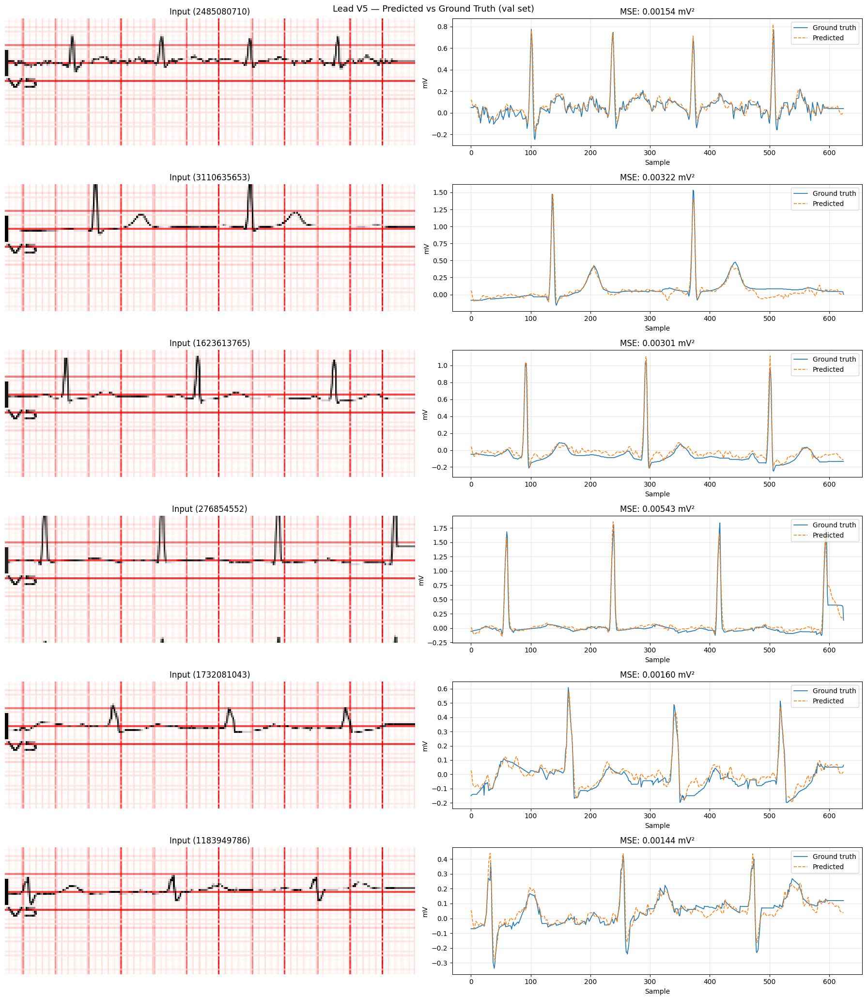

In [214]:
lead = "V5"
save_string =  "best_model_"+ lead + ".pt"
ckpt = torch.load(CHECKPOINT_DIR / save_string, map_location=DEVICE)
model.load_state_dict(ckpt["model_state"])
model.eval()

# Loss curves
# fig, ax = plt.subplots(figsize=(10, 4))
# ax.plot(train_losses[lead], label="Train")
# ax.plot(val_losses[lead],   label="Val")
# ax.set_xlabel("Epoch")
# ax.set_ylabel("Loss")
# ax.set_title("Lead " + lead + " — Training curves")
# ax.legend()
# ax.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()

# Predictions vs ground truth
fig, axes = plt.subplots(6, 2, figsize=(18, 3.5 * 6))
fig.suptitle("Lead " + lead + " — Predicted vs Ground Truth (val set)", fontsize=13)
sample_rows = development_csv_dict[lead].sample(6, random_state=0).reset_index(drop=True)

for i, row in sample_rows.iterrows():
    img    = cv2.imread(row["chunk_path"])
    img    = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img    = cv2.resize(img, (IMG_W, IMG_H)).astype(np.float32) / 255.0
    tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred = model(tensor).squeeze().cpu().numpy()

    df_ts = pd.read_csv(row["csv_path"])
    gt    = df_ts[lead].dropna().values.astype(np.float32)
    if len(gt) != SAMPLES_PER_LEAD:
        ix = np.linspace(0, len(gt)-1, SAMPLES_PER_LEAD)
        gt = np.interp(ix, np.arange(len(gt)), gt).astype(np.float32)

    mse = float(np.mean((pred - gt)**2))

    axes[i, 0].imshow(img, aspect="auto")
    axes[i, 0].set_title(f"Input ({row['record_id']})")
    axes[i, 0].axis("off")

    axes[i, 1].plot(gt,   label="Ground truth", linewidth=1.2)
    axes[i, 1].plot(pred, label="Predicted",    linewidth=1.2, linestyle="--")
    axes[i, 1].set_title(f"MSE: {mse:.5f} mV²")
    axes[i, 1].set_xlabel("Sample")
    axes[i, 1].set_ylabel("mV")
    axes[i, 1].legend(loc="upper right")
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [209]:
# Rebuild dataloaders with new index
train_losses = {}
val_losses = {}
lead = "II"
shuffled     = index_df.sample(frac=1, random_state=42).reset_index(drop=True)
n_val        = max(1, int(len(shuffled) * 0.15))
train_df     = training_csv_dict[lead]
val_df       = development_csv_dict[lead]
train_ds     = ECGLeadDataset(train_df, augment=True)
val_ds       = ECGLeadDataset(val_df,   augment=False)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=0)
print(f"{lead}: Train: {len(train_ds)}  |  Val: {len(val_ds)}")

# Reinitialise model and optimizer
model     = ECGModel().to(DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

best_val_loss  = float("inf")
train_losses[lead] = []
val_losses[lead] = []

for epoch in range(1, EPOCHS + 1):
    model.train()
    train_loss = 0.0
    for imgs, targets in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        loss = ecg_loss(model(imgs), targets)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)
    train_loss /= len(train_ds)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            val_loss += ecg_loss(model(imgs), targets).item() * imgs.size(0)
    val_loss /= len(val_ds)

    scheduler.step()
    train_losses[lead].append(train_loss)
    val_losses[lead].append(val_loss)
    print(f"Epoch {epoch:3d} | train loss: {train_loss:.6f} | val loss: {val_loss:.6f}")

    save_string =  "best_model_"+ lead + ".pt"
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "epoch":       epoch,
            "model_state": model.state_dict(),
            "val_loss":    val_loss,
        }, CHECKPOINT_DIR / save_string)
        print(f"Saved {lead} (val loss {val_loss:.6f})")

print(f"\n{lead} Done. Best val loss: {best_val_loss:.6f}") 

II: Train: 453  |  Val: 142


Epoch 1/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   1 | train loss: 0.134314 | val loss: 0.118605
Saved II (val loss 0.118605)


Epoch 2/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   2 | train loss: 0.131416 | val loss: 0.117337
Saved II (val loss 0.117337)


Epoch 3/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   3 | train loss: 0.129323 | val loss: 0.120800


Epoch 4/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   4 | train loss: 0.128421 | val loss: 0.117774


Epoch 5/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   5 | train loss: 0.126372 | val loss: 0.117657


Epoch 6/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   6 | train loss: 0.123422 | val loss: 0.118162


Epoch 7/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   7 | train loss: 0.121299 | val loss: 0.118581


Epoch 8/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   8 | train loss: 0.117949 | val loss: 0.119708


Epoch 9/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch   9 | train loss: 0.114585 | val loss: 0.122056


Epoch 10/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  10 | train loss: 0.115058 | val loss: 0.123325


Epoch 11/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  11 | train loss: 0.109302 | val loss: 0.125446


Epoch 12/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  12 | train loss: 0.104800 | val loss: 0.121788


Epoch 13/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  13 | train loss: 0.103165 | val loss: 0.123679


Epoch 14/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  14 | train loss: 0.097923 | val loss: 0.126091


Epoch 15/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  15 | train loss: 0.091927 | val loss: 0.127019


Epoch 16/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  16 | train loss: 0.088478 | val loss: 0.127261


Epoch 17/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  17 | train loss: 0.084242 | val loss: 0.130521


Epoch 18/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  18 | train loss: 0.081495 | val loss: 0.129036


Epoch 19/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  19 | train loss: 0.079860 | val loss: 0.133158


Epoch 20/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  20 | train loss: 0.077963 | val loss: 0.132087


Epoch 21/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  21 | train loss: 0.072954 | val loss: 0.128555


Epoch 22/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  22 | train loss: 0.069166 | val loss: 0.133211


Epoch 23/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  23 | train loss: 0.066491 | val loss: 0.132651


Epoch 24/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  24 | train loss: 0.064237 | val loss: 0.132079


Epoch 25/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  25 | train loss: 0.061779 | val loss: 0.132868


Epoch 26/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  26 | train loss: 0.060103 | val loss: 0.133558


Epoch 27/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  27 | train loss: 0.058281 | val loss: 0.133925


Epoch 28/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  28 | train loss: 0.056799 | val loss: 0.134786


Epoch 29/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  29 | train loss: 0.055711 | val loss: 0.134777


Epoch 30/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  30 | train loss: 0.056196 | val loss: 0.135948


Epoch 31/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  31 | train loss: 0.054492 | val loss: 0.135468


Epoch 32/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  32 | train loss: 0.052621 | val loss: 0.136184


Epoch 33/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  33 | train loss: 0.051639 | val loss: 0.136399


Epoch 34/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  34 | train loss: 0.050819 | val loss: 0.135932


Epoch 35/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  35 | train loss: 0.050137 | val loss: 0.136203


Epoch 36/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  36 | train loss: 0.049223 | val loss: 0.136605


Epoch 37/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  37 | train loss: 0.048782 | val loss: 0.137235


Epoch 38/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  38 | train loss: 0.048258 | val loss: 0.136217


Epoch 39/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  39 | train loss: 0.047708 | val loss: 0.136358


Epoch 40/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  40 | train loss: 0.047287 | val loss: 0.137649


Epoch 41/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  41 | train loss: 0.047070 | val loss: 0.136974


Epoch 42/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  42 | train loss: 0.046963 | val loss: 0.137168


Epoch 43/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  43 | train loss: 0.046654 | val loss: 0.137529


Epoch 44/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  44 | train loss: 0.046353 | val loss: 0.137429


Epoch 45/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  45 | train loss: 0.046362 | val loss: 0.137537


Epoch 46/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  46 | train loss: 0.046039 | val loss: 0.137398


Epoch 47/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  47 | train loss: 0.046087 | val loss: 0.137507


Epoch 48/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  48 | train loss: 0.045971 | val loss: 0.137432


Epoch 49/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  49 | train loss: 0.045930 | val loss: 0.137378


Epoch 50/50:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch  50 | train loss: 0.045988 | val loss: 0.137218

II Done. Best val loss: 0.117337


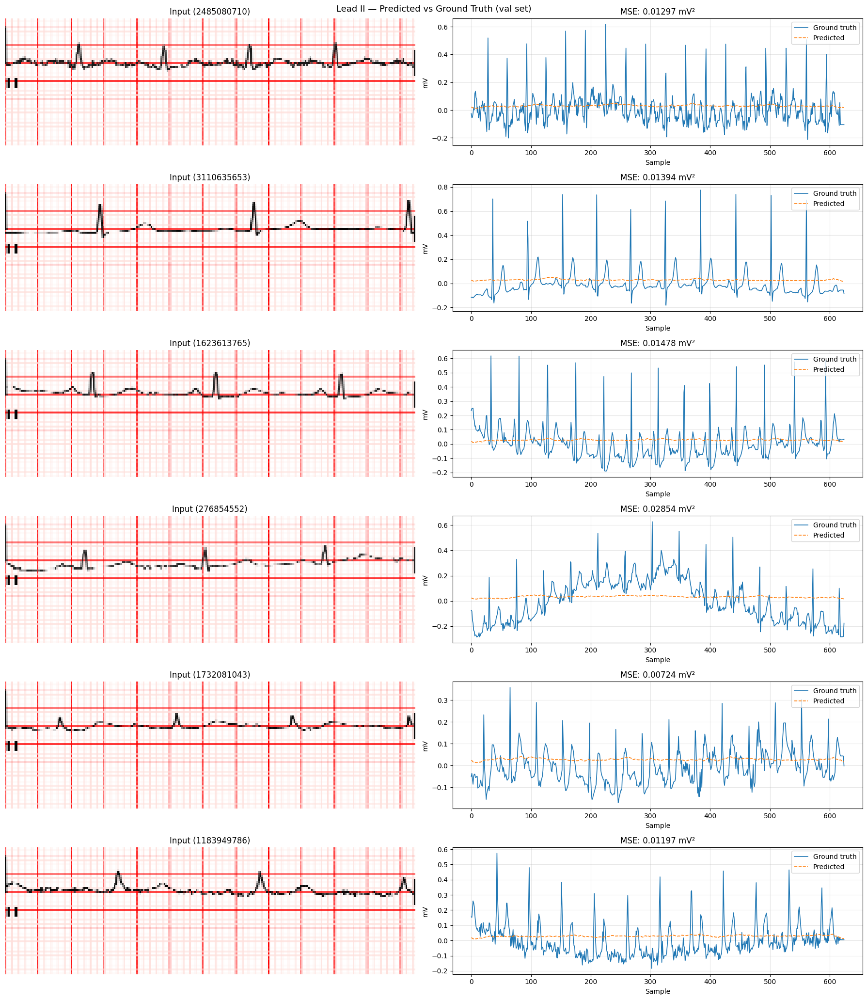

In [210]:
lead = "II"
save_string =  "best_model_"+ lead + ".pt"
ckpt = torch.load(CHECKPOINT_DIR / save_string, map_location=DEVICE)
model.load_state_dict(ckpt["model_state"])
model.eval()

# Loss curves
# fig, ax = plt.subplots(figsize=(10, 4))
# ax.plot(train_losses[lead], label="Train")
# ax.plot(val_losses[lead],   label="Val")
# ax.set_xlabel("Epoch")
# ax.set_ylabel("Loss")
# ax.set_title("Lead " + lead + " — Training curves")
# ax.legend()
# ax.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()

# Predictions vs ground truth
fig, axes = plt.subplots(6, 2, figsize=(18, 3.5 * 6))
fig.suptitle("Lead " + lead + " — Predicted vs Ground Truth (val set)", fontsize=13)
sample_rows = development_csv_dict[lead].sample(6, random_state=0).reset_index(drop=True)

for i, row in sample_rows.iterrows():
    img    = cv2.imread(row["chunk_path"])
    img    = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img    = cv2.resize(img, (IMG_W, IMG_H)).astype(np.float32) / 255.0
    tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred = model(tensor).squeeze().cpu().numpy()

    df_ts = pd.read_csv(row["csv_path"])
    gt    = df_ts[lead].dropna().values.astype(np.float32)
    if len(gt) != SAMPLES_PER_LEAD:
        ix = np.linspace(0, len(gt)-1, SAMPLES_PER_LEAD)
        gt = np.interp(ix, np.arange(len(gt)), gt).astype(np.float32)

    mse = float(np.mean((pred - gt)**2))

    axes[i, 0].imshow(img, aspect="auto")
    axes[i, 0].set_title(f"Input ({row['record_id']})")
    axes[i, 0].axis("off")

    axes[i, 1].plot(gt,   label="Ground truth", linewidth=1.2)
    axes[i, 1].plot(pred, label="Predicted",    linewidth=1.2, linestyle="--")
    axes[i, 1].set_title(f"MSE: {mse:.5f} mV²")
    axes[i, 1].set_xlabel("Sample")
    axes[i, 1].set_ylabel("mV")
    axes[i, 1].legend(loc="upper right")
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()